# New Ollivier-Ricci Curvature Library Exploration

The previous local OR curvature implementation appeared to produce unreliable values: it estimated a single global $W_1$-like quantity and reused it when computing edge-level curvature.

This notebook uses `GraphRicciCurvature` as a cleaner reference implementation for small and medium NetworkX graphs. The workflow is intentionally compact: define graphs, compute curvature, summarize values, and visualize both graph structure and edge-curvature distributions.

## 1. System settings & executables

In [241]:
# # Run this cell only when the selected notebook kernel is missing dependencies.
# import sys
# from pathlib import Path
# import os

# print(sys.executable)
# os.environ["PATH"] = f"{Path(sys.executable).parent}:{os.environ.get('PATH', '')}"
# !{sys.executable} -m pip install --upgrade pip
# !{sys.executable} -m pip install networkx pandas matplotlib seaborn
# !{sys.executable} -m pip install cmake
# !{sys.executable} -m pip install GraphRicciCurvature

## 2. Imports

In [242]:
# system
import os
import sys
from pathlib import Path

# Kernel-safety settings must be applied before importing the scientific stack.
# GraphRicciCurvature pulls in NetworKit/OpenMP; these settings avoid the
# silent kernel deaths that can happen in notebook kernels on macOS.
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
os.environ.setdefault("OMP_NUM_THREADS", "1")
os.environ.setdefault("MKL_NUM_THREADS", "1")
os.environ.setdefault("OPENBLAS_NUM_THREADS", "1")
os.environ.setdefault("VECLIB_MAXIMUM_THREADS", "1")
os.environ.setdefault("NUMEXPR_NUM_THREADS", "1")
os.environ.setdefault("MPLCONFIGDIR", "/tmp/matplotlib-cache")

# standard data science libraries
import torch
import numpy as np
import pandas as pd

# plotting
import seaborn as sns
import networkx as nx

# matplotlib
import matplotlib.pyplot as plt

# utilities
from typing import Literal 

# GraphRicciCurvature is intentionally imported lazily inside the compute
# function, after the environment above is already configured.

## 3. Utilities

### 3.1 Global Variables

In [243]:
# GraphRicciCurvature configuration for the toy graphs above.
# ATD is the safest notebook default. Switch to "OTD" for exact transport
# on small graphs after the workflow is running reliably.
GRAPH_RICCI_ALPHA_ARRAY = (0.0, 0.5, 0.999)
GRAPH_RICCI_METHOD = "OTD"
GRAPH_RICCI_WEIGHT = "weight"
GRAPH_RICCI_PROC = 1
GRAPH_RICCI_SHORTEST_PATH = "all_pairs"
GRAPH_RICCI_VERBOSE = "ERROR"
GRAPH_RICCI_INCLUDE_LARGE_GRAPHS = True
LIMIT_CURV = True

# for individual graphs
GRAPH_RICCI_PLOT_ALPHA = GRAPH_RICCI_ALPHA_ARRAY[-1]
GRAPH_RICCI_TANH_SCALE = True

# General
SEED = 42

Detour on Wasserstein approximation methods:
1. **OTD**: solves the actual discrete Kantorovich OT problem using Python Optimal Transport ie.: uses `ot.emd2` to solve the linear problem $\min_{\pi}\,\langle \pi, C\rangle$, considering $\pi_{ij}$ an $i \to j$ transport plan. Runs between $O(n^3)$ and $O(n^3\log(k))$
2. **Sinkhorn**: solves the entropy-regularized Kantorovich OT problem $\min_{\pi}\,\langle \pi, C\rangle - \epsilon H(\pi)$, assuming $H(\pi)$ = $-\sum_{ij} \pi_{ij}\log \pi_{ij}$, ie.: problem's entropy. Runs in $O(n^2)$
1. **ATD**: crudest optimization, plainly computes $\sum_{ij} \mu_x(i) \mu_y(j) d(i,j)$, measures average neighborhood separation

If you have small datasets, use OTD, otherwise Sinkhorn, avoid ATD as long as it is feasible to do so

### 3.2 Functions

In [244]:
# Basic graph cleaning used before any curvature computation.
def clean_graph(G):
    H = nx.convert_node_labels_to_integers(G)
    H = nx.Graph(H)  # force a simple undirected graph
    H.remove_edges_from(nx.selfloop_edges(H))
    return H


def prepare_graph_for_graph_ricci(G, weight=GRAPH_RICCI_WEIGHT, default_weight=1.0):
    """Return a simple graph whose edge weights are valid positive distances."""
    H = clean_graph(G)

    for _, _, data in H.edges(data=True):
        edge_weight = data.get(weight, default_weight)
        try:
            edge_weight = float(edge_weight)
        except (TypeError, ValueError):
            edge_weight = default_weight

        if not np.isfinite(edge_weight) or edge_weight <= 0:
            edge_weight = default_weight

        data[weight] = edge_weight

    return H


def edge_curvature_dict(G, curvature_attribute="ricciCurvature"):
    """Extract edge curvature as {(u, v): value} with sorted edge keys."""
    return {
        tuple(sorted((u, v))): float(data[curvature_attribute])
        for u, v, data in G.edges(data=True)
        if curvature_attribute in data
    }


def node_curvature_dict(G, curvature_attribute="ricciCurvature"):
    """Extract node curvature as {node: value}, when the library provides it."""
    return {
        node: float(data[curvature_attribute])
        for node, data in G.nodes(data=True)
        if curvature_attribute in data
    }


def summarize_edge_curvature(values):
    """Small numeric summary for an edge-curvature array."""
    values = np.array(values, dtype=float)
    if len(values) == 0:
        return {"min": np.nan, "mean": np.nan, "median": np.nan, "max": np.nan, "std": np.nan}

    return {
        "min": values.min(),
        "mean": values.mean(),
        "median": np.median(values),
        "max": values.max(),
        "std": values.std(),
    }

### 3.3 Standard Graphs Dictionary

In [245]:
# Hyperparameters
seed = SEED

# Graphs required
graphs = {
    # lattice / Euclidean-ish
    "grid": nx.grid_2d_graph(25, 25),
    "cycle": nx.cycle_graph(12),

    # regular graphs
    "random_3_regular": nx.random_regular_graph(d=3, n=70, seed=seed),
    "complete": nx.complete_graph(12),

    # random graph models
    "barabasi_albert": nx.barabasi_albert_graph(n=100, m=3, seed=seed),
    "watts_strogatz": nx.watts_strogatz_graph(n=100, k=6, p=0.26, seed=seed),
    "erdos_renyi": nx.erdos_renyi_graph(n=100, p=0.25, seed=seed),
}

# The SBM is useful, but substantially heavier for OR curvature.
# Enable GRAPH_RICCI_INCLUDE_LARGE_GRAPHS above when you want it included.
large_graphs = {
    "sbm_3_blocks": nx.stochastic_block_model(
        sizes=[100, 100, 100],
        p=[
            [0.75, 0.001, 0.001],
            [0.001, 0.75, 0.001],
            [0.001, 0.001, 0.75],
        ],
        seed=seed
    ),
}

if GRAPH_RICCI_INCLUDE_LARGE_GRAPHS:
    graphs.update(large_graphs)

# graph cleaning
graphs = {name: clean_graph(G) for name, G in graphs.items()}

graph_overview = pd.DataFrame([
    {
        "graph": name,
        "nodes": graph.number_of_nodes(),
        "edges": graph.number_of_edges(),
        "components": nx.number_connected_components(graph),
        "density": nx.density(graph),
    }
    for name, graph in graphs.items()
])
# display(graph_overview)

## 4. Ollivier-Ricci Computation

The library treats edge weights as **distances** for shortest-path computations. For unweighted toy graphs, every edge receives distance `1.0`.

`method="ATD"` is the safest notebook default because it avoids the heaviest exact-transport path. For exact optimal transport on small graphs, set `GRAPH_RICCI_METHOD = "OTD"`. If a graph becomes slow or unstable, keep `GRAPH_RICCI_INCLUDE_LARGE_GRAPHS = False` and reduce the alpha list.

In [246]:
def compute_graph_ollivier_ricci(
    G,
    alpha,
    method=GRAPH_RICCI_METHOD,
    weight=GRAPH_RICCI_WEIGHT,
    proc=GRAPH_RICCI_PROC,
    shortest_path=GRAPH_RICCI_SHORTEST_PATH,
    verbose=GRAPH_RICCI_VERBOSE,
    limit_curv: bool = LIMIT_CURV
):
    """Compute OR curvature and return graph, edge values, node values, and summary."""
    H = prepare_graph_for_graph_ricci(G, weight=weight)

    if H.number_of_edges() == 0:
        edge_rc = {}
        node_rc = {}
        summary = summarize_edge_curvature([])
    else:
        from GraphRicciCurvature.OllivierRicci import OllivierRicci as GraphOllivierRicci

        orc = GraphOllivierRicci(
            G=H,
            weight=weight,
            alpha=alpha,
            method=method,
            proc=proc,
            shortest_path=shortest_path,
            verbose=verbose,
        )
        H = orc.compute_ricci_curvature()
        edge_rc = edge_curvature_dict(H)
        if limit_curv:
            edge_rc = {edge: value / (1 - alpha) for edge, value in edge_rc.items()}
        summary = summarize_edge_curvature(list(edge_rc.values()))

    summary.update({
        "nodes": H.number_of_nodes(),
        "edges": H.number_of_edges(),
        "components": nx.number_connected_components(H),
        "alpha": alpha,
        "method": method,
    })

    return {
        "graph": H,
        "edge_curvature": edge_rc,
        "summary": summary,
    }

In [247]:
# # Implementation
# graph_ricci_results = {}
# summary_rows = []

# for name, graph in graphs.items():
#     for alpha in GRAPH_RICCI_ALPHA_ARRAY:
#         result = compute_graph_ollivier_ricci(graph, alpha=alpha, limit_curv=LIMIT_CURV)
#         graph_ricci_results[(name, alpha)] = result
#         summary_rows.append({"graph": name, **result["summary"]})

# graph_ricci_summary = pd.DataFrame(summary_rows)
# display(graph_ricci_summary)

## 5. Visual Diagnostics

### 5.1 Functions

In [248]:
def plot_curvature_graph(G, curvature_dict, title=None, layout_seed=SEED, tanh_scale=False):
    """Plot edge curvature directly on a graph."""
    H = nx.convert_node_labels_to_integers(G)
    pos = nx.spring_layout(H, seed=layout_seed)
    edges = list(H.edges())
    values = np.array(
        [curvature_dict.get(tuple(sorted((u, v))), 0.0) for u, v in edges],
        dtype=float,
    )
    plot_values = np.tanh(values) if tanh_scale else values
    # vmax = max(abs(plot_values.min()), abs(plot_values.max()), 1e-12) if len(plot_values) else 1.0
    vmax = 1 # simplified limits

    fig, ax = plt.subplots(figsize=(7, 4))
    nx.draw_networkx_nodes(H, pos, node_size=10, node_color="black", ax=ax)
    nx.draw_networkx_edges(
        H,
        pos,
        edgelist=edges,
        edge_color=plot_values,
        edge_cmap=plt.cm.coolwarm,
        edge_vmin=-vmax,
        edge_vmax=vmax,
        width=1.6,
        ax=ax,
    )

    ax.set_title(title or "Ollivier-Ricci curvature")
    ax.axis("off")

    sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=-vmax, vmax=vmax))
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label="tanh(curvature)" if tanh_scale else "curvature")
    plt.show()


def plot_curvature_graph_histogram(
    G,
    curvature_dict,
    title=None,
    layout_seed=SEED,
    bins=20,
    tanh_scale=False,
):
    """Plot the graph and its edge-curvature histogram side by side."""
    H = nx.convert_node_labels_to_integers(G)
    pos = nx.spring_layout(H, seed=layout_seed)
    edges = list(H.edges())
    values = np.array(
        [curvature_dict.get(tuple(sorted((u, v))), 0.0) for u, v in edges],
        dtype=float,
    )
    plot_values = np.tanh(values) if tanh_scale else values
    if len(plot_values) == 0:
        return

    # vmax = max(abs(plot_values.min()), abs(plot_values.max()), 1e-12)
    vmax = 1 # simplified limits
    fig, axes = plt.subplots(1, 2, figsize=(10, 3.8), gridspec_kw={"width_ratios": [1.2, 1]})

    nx.draw_networkx_nodes(H, pos, node_size=10, node_color="black", ax=axes[0])
    nx.draw_networkx_edges(
        H,
        pos,
        edgelist=edges,
        edge_color=plot_values,
        edge_cmap=plt.cm.coolwarm,
        edge_vmin=-vmax,
        edge_vmax=vmax,
        width=1.6,
        ax=axes[0],
    )
    axes[0].axis("off")
    axes[0].set_title("Graph")

    sns.histplot(plot_values, bins=bins, kde=False, ax=axes[1], color="steelblue")
    
    if tanh_scale:
        axes[1].set_xlim(-1,1)
    axes[1].axvline(0, color="black", linewidth=1)
    axes[1].set_title("Edge curvature")
    axes[1].set_xlabel("tanh(curvature)" if tanh_scale else "curvature")
    axes[1].set_ylabel("edge count")

    fig.suptitle(title or "GraphRicciCurvature")
    fig.tight_layout()
    plt.show()

### 5.2 Plotting

In [249]:
# for name in graphs.keys():
#     result = graph_ricci_results[(name, GRAPH_RICCI_PLOT_ALPHA)]
#     plot_curvature_graph_histogram(
#         result["graph"],
#         result["edge_curvature"],
#         title=f"{name} - alpha={GRAPH_RICCI_PLOT_ALPHA:g}",
#         bins=20,
#         tanh_scale=GRAPH_RICCI_TANH_SCALE,
#     )

## 6. Alpha Comparison

In [250]:
def plot_alpha_histograms(name, bins=15, tanh_scale=False):
    """Compare edge-curvature distributions for all configured alpha values."""
    fig, axes = plt.subplots(1, len(GRAPH_RICCI_ALPHA_ARRAY), figsize=(4 * len(GRAPH_RICCI_ALPHA_ARRAY), 3), sharey=True)
    axes = np.atleast_1d(axes)

    for ax, alpha in zip(axes, GRAPH_RICCI_ALPHA_ARRAY):
        values = np.array(list(graph_ricci_results[(name, alpha)]["edge_curvature"].values()), dtype=float)
        plot_values = np.tanh(values) if tanh_scale else values
        sns.histplot(plot_values, bins=bins, ax=ax, color="steelblue")
        if tanh_scale:
            ax.set_xlim(-1,1)
        ax.axvline(0, color="black", linewidth=1)
        ax.set_title(f"alpha={alpha:g}")
        ax.set_xlabel("tanh(curvature)" if tanh_scale else "curvature")

    fig.suptitle(f"{name} - alpha comparison")
    fig.tight_layout()
    plt.show()

# for name in graphs.keys():
#     plot_alpha_histograms(name, bins=10, tanh_scale=GRAPH_RICCI_TANH_SCALE)

## 7. Synthetic Datasets Application

we generate synthetic datasets assuming a parametrized variable distribution and use the absolute values of Laplacian weights as transport distance

### 7.1 Synthetic Dataset Generation

In [251]:
# General parameters
LAYERS = 2
SELECTED_LAYER = 0

EPOCHS = 500
STALK_DIM = 1
DATASET = "synthetic_exp"

HIDDEN_CHANNELS = 16
SYNTHETIC_NODES = 250
SEED = 43
NODE_DEGREE = 3

# Global lists
HET_COEF_LIST = .1,
NUM_CLASSES_LIST = 2,
NUM_FEATS_LIST = 32,

In [252]:
# # !! RUN ONLY FOR NEW EXPERIMENTS !!

# het_coef_list = " ".join(str(_) for _ in HET_COEF_LIST) if type(HET_COEF_LIST) == tuple else str(HET_COEF_LIST)
# num_classes_list = " ".join(str(_) for _ in NUM_CLASSES_LIST) if type(NUM_CLASSES_LIST) == tuple else str(NUM_CLASSES_LIST)
# num_feats_list = " ".join(str(_) for _ in NUM_FEATS_LIST) if type(NUM_FEATS_LIST) == tuple else str(NUM_FEATS_LIST)
# # normalization_options = "True"
# normalization_options = "True False"

# PYTHON_EXEC = sys.executable

# # bash command to run the grid search
# %cd /Users/luigifracassetti/projects/neural-sheaf-diffusion
# !bash ./exp/scripts/grid_launcher.sh \
#     "{PYTHON_EXEC}" \
#     {LAYERS} \
#     {EPOCHS} \
#     {STALK_DIM} \
#     {DATASET} \
#     {HIDDEN_CHANNELS} \
#     {SYNTHETIC_NODES} \
#     {SEED} \
#     {NODE_DEGREE} \
#     "{normalization_options}" \
#     "{het_coef_list}" \
#     "{num_classes_list}" \
#     "{num_feats_list}"

### 7.2 Synthetic Dataset Retrieval

In [253]:
# basic loop to load the maps and laplacians for each dataset and layer,
# given the same hyper-parameters (layer, heterophilic coefficient, number of classes, number of features)

# data retrieval containers
norm_laplacians, unnorm_laplacians = [], []
var_combinations_dict = {}

# project root (ABSOLUTE PATH)
working_directory = Path("/Users/luigifracassetti/projects/neural-sheaf-diffusion")

# base results directory
results_root = working_directory / "results" / "laplacians"

# retrieval loop
for layer in range(LAYERS):
    for het_coef in HET_COEF_LIST:
        for num_classes in NUM_CLASSES_LIST:
            for num_feats in NUM_FEATS_LIST:

                combination = (layer, het_coef, num_classes, num_feats)

                var_combinations_dict[combination] = {
                    "norm_laplacian": None,
                    "unnorm_laplacian": None
                }

                filename = (
                    f"DiagSheaf_nodes-{SYNTHETIC_NODES}"
                    f"_node-deg-{NODE_DEGREE}"
                    f"_layer{layer}"
                    f"_pct-hetero-{int(float(het_coef) * 100)}"
                    f"_classes-{num_classes}"
                    f"_feats-{num_feats}"
                    f"_seed{SEED}.pt"
                )

                norm_laplacian_path = (
                    results_root
                    / DATASET
                    / "normalised-true"
                    / f"stalk_dim-{STALK_DIM}"
                    / f"{LAYERS}-layers"
                    / f"{HIDDEN_CHANNELS}-hidden"
                    / f"{EPOCHS}-epochs"
                    / filename
                )

                unnorm_laplacian_path = (
                    results_root
                    / DATASET
                    / "normalised-false"
                    / f"stalk_dim-{STALK_DIM}"
                    / f"{LAYERS}-layers"
                    / f"{HIDDEN_CHANNELS}-hidden"
                    / f"{EPOCHS}-epochs"
                    / filename
                )
                
                if os.path.exists(norm_laplacian_path) and os.path.exists(unnorm_laplacian_path):
                    norm_laplacian = torch.load(norm_laplacian_path)
                    unnorm_laplacian = torch.load(unnorm_laplacian_path)

                    var_combinations_dict[combination]["norm_laplacian"] = norm_laplacian                    
                    var_combinations_dict[combination]["unnorm_laplacian"] = unnorm_laplacian
                else:
                    print(f"Missing files for combination: {combination}")
                    continue

                norm_laplacian_df = pd.DataFrame(var_combinations_dict[combination]["norm_laplacian"].cpu().tolist())
                var_combinations_dict[combination]["norm_laplacians_dataframe"] = norm_laplacian_df
                
                unnorm_laplacian_df = pd.DataFrame(var_combinations_dict[combination]["unnorm_laplacian"].cpu().tolist())
                var_combinations_dict[combination]["unnorm_laplacians_dataframe"] = unnorm_laplacian_df

                # normalized final l0
                df_norm = norm_laplacian_df.transpose().copy()
                df_norm.rename(columns={0: "source", 1: "target", 2: "value"}, inplace=True)
                df_norm_new = df_norm.pivot(index="source", columns="target", values="value").fillna(0)
                l0_norm = df_norm_new.to_numpy()
                var_combinations_dict[combination]["l0_norm"] = l0_norm
                print(f"final normalized laplacian: {l0_norm}")
                print(f"shape: {l0_norm.shape}")
                
                # unnormalized final l0
                df_unnorm = unnorm_laplacian_df.transpose().copy()
                df_unnorm.rename(columns={0: "source", 1: "target", 2: "value"}, inplace=True)
                df_unnorm_new = df_unnorm.pivot(index="source", columns="target", values="value").fillna(0)
                l0_unnorm = df_unnorm_new.to_numpy()
                var_combinations_dict[combination]["l0_unnorm"] = l0_unnorm
                print(f"final unnormalized laplacian: {l0_unnorm}")
                print(f"shape: {l0_unnorm.shape}")

final normalized laplacian: [[0.52423793 0.         0.         ... 0.         0.         0.        ]
 [0.         0.60694116 0.         ... 0.         0.         0.        ]
 [0.         0.         0.00091385 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.08916163 0.         0.        ]
 [0.         0.         0.         ... 0.         0.56061459 0.        ]
 [0.         0.         0.         ... 0.         0.         0.18239887]]
shape: (250, 250)
final unnormalized laplacian: [[1.01912963 0.         0.         ... 0.         0.         0.        ]
 [0.         0.85513693 0.         ... 0.         0.         0.        ]
 [0.         0.         0.01111863 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.16045466 0.         0.        ]
 [0.         0.         0.         ... 0.         0.64388865 0.        ]
 [0.         0.         0.         ... 0.         0.         0.36208463]]
shape: (250, 250)
final normalized l

### 7.3 Weights Retrieval Function

In [254]:
def weights_retrieval(
        L: Literal["norm_Laplacian", "unnorm_Laplacian"],
        parameters_combination: tuple):
    """Extract positive upper-triangle edge weights from a stored 0-Laplacian."""
    laplacian_keys = {
        "norm_Laplacian": "l0_norm",
        "unnorm_Laplacian": "l0_unnorm",
    }
    if L not in laplacian_keys:
        raise ValueError(f"Invalid L value: {L}. Expected one of {tuple(laplacian_keys)}.")

    L_0 = var_combinations_dict[parameters_combination][laplacian_keys[L]]
    edge_weights = np.abs(L_0)
    rows, cols = np.where(np.triu(L_0 != 0, k=1))
    edge_weights_dict = {
        (int(i), int(j)): float(edge_weights[i, j])
        for i, j in zip(rows, cols)
    }

    return L_0, dict(sorted(edge_weights_dict.items())), edge_weights

### 7.4 Synthetic Dataset Curvature Plotting

In [255]:
def build_weighted_graph_from_laplacian_edges(edge_weights_dict, min_distance=1e-12):
    """Build the weighted graph expected by GraphRicciCurvature."""
    graph = nx.Graph()
    if edge_weights_dict:
        graph.add_nodes_from(range(max(max(edge) for edge in edge_weights_dict) + 1))

    for (u, v), value in edge_weights_dict.items():
        distance = max(abs(float(value)), min_distance)
        graph.add_edge(int(u), int(v), weight=distance, laplacian_weight=distance)

    return graph


def edge_plot_values(graph, curvature_dict):
    """Align edge list, Laplacian weights and OR curvature values."""
    rows = [
        (edge, graph[u][v]["laplacian_weight"], curvature_dict.get(tuple(sorted(edge)), np.nan))
        for edge in graph.edges()
        for u, v in [edge]
    ]
    rows = [(edge, weight, curvature) for edge, weight, curvature in rows if np.isfinite(curvature)]
    edges, weights, curvatures = zip(*rows)

    return list(edges), np.array(weights), np.array(curvatures)


def draw_edge_colored_graph(graph, positions, edges, values, ax, title, cmap, label, vmin=None, vmax=None):
    """Draw a fixed-layout graph whose edges are colored by `values`."""
    nx.draw_networkx_nodes(graph, positions, node_size=10, node_color="#f8fafc", edgecolors="#475569", ax=ax)
    # nx.draw_networkx_labels(graph, positions, font_size=6, font_color="#0f172a", ax=ax)
    edge_collection = nx.draw_networkx_edges(
        graph,
        positions,
        edgelist=edges,
        edge_color=values,
        edge_cmap=cmap,
        edge_vmin=vmin,
        edge_vmax=vmax,
        width=2.0,
        ax=ax,
    )
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(edge_collection, ax=ax, fraction=0.046, pad=0.02, label=label)


def add_linear_fit(ax, x, y, color="#111827"):
    """Add a least-squares line and R^2 annotation to an existing scatter axis."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    valid = np.isfinite(x) & np.isfinite(y)
    if valid.sum() < 2:
        return np.nan

    x, y = x[valid], y[valid]
    slope, intercept = np.polyfit(x, y, deg=1)
    y_hat = slope * x + intercept
    ss_res = np.sum((y - y_hat) ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)
    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    x_line = np.linspace(x.min(), x.max(), 100)
    ax.plot(x_line, slope * x_line + intercept, color=color, linewidth=2, label=f"linear fit, R^2={r2:.3f}")
    ax.text(
        0.02,
        0.98,
        f"y = {slope:.3g}x + {intercept:.3g}\nR^2 = {r2:.3f}",
        transform=ax.transAxes,
        ha="left",
        va="top",
        bbox={"boxstyle": "round,pad=0.3", "facecolor": "white", "edgecolor": "#cbd5e1", "alpha": 0.9},
    )

    return r2


def plot_synthetic_or_slide(graph, curvature_dict, title, bins=25, tanh_scale=GRAPH_RICCI_TANH_SCALE):
    """Plot topology, edge weights, OR curvature and their joint behavior."""
    edges, weights, curvatures = edge_plot_values(graph, curvature_dict)
    shown_curvatures = np.tanh(curvatures) if tanh_scale else curvatures
    curvature_label = "tanh(OR curvature)" if tanh_scale else "OR curvature"

    fig, ax = plt.subplot_mosaic(
        [["weight_graph", "curvature_graph"], ["weight_hist", "curvature_hist"], ["scatter", "scatter"]],
        figsize=(14, 13),
        constrained_layout=True,
    )
    positions = nx.spring_layout(graph, seed=SEED, weight=None)

    draw_edge_colored_graph(graph, positions, edges, weights, ax["weight_graph"], "Graph colored by edge weight", plt.cm.viridis, "|L_ij|")
    draw_edge_colored_graph(graph, positions, edges, shown_curvatures, ax["curvature_graph"], "Graph colored by OR curvature", plt.cm.coolwarm, curvature_label, -1 if tanh_scale else None, 1 if tanh_scale else None)
    sns.histplot(weights, bins=bins, kde=True, color="#2563eb", ax=ax["weight_hist"])
    sns.histplot(shown_curvatures, bins=bins, kde=True, color="#dc2626", ax=ax["curvature_hist"])
    sns.scatterplot(x=weights, y=shown_curvatures, s=45, color="#059669", edgecolor="white", ax=ax["scatter"])
    add_linear_fit(ax["scatter"], weights, shown_curvatures)

    ax["weight_hist"].set(title="Edge weight distribution", xlabel="|L_ij|", ylabel="edge count")
    ax["curvature_hist"].axvline(0, color="#0f172a", linestyle="--", linewidth=1)
    ax["curvature_hist"].set(title="Curvature distribution", xlabel=curvature_label, ylabel="edge count")
    ax["scatter"].axhline(0, color="#0f172a", linestyle="--", linewidth=1)
    ax["scatter"].set(title="Weights vs curvature", xlabel="|L_ij|", ylabel=curvature_label)

    fig.suptitle(title, fontsize=14)
    plt.show()

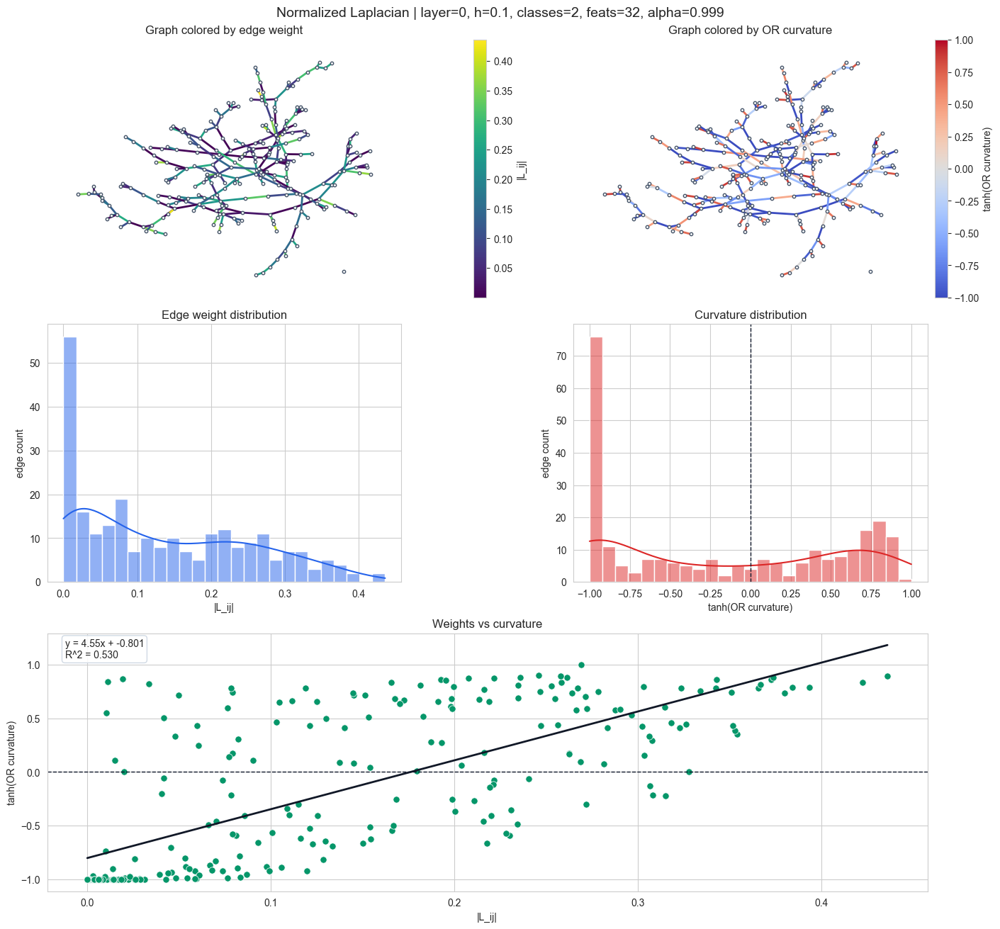

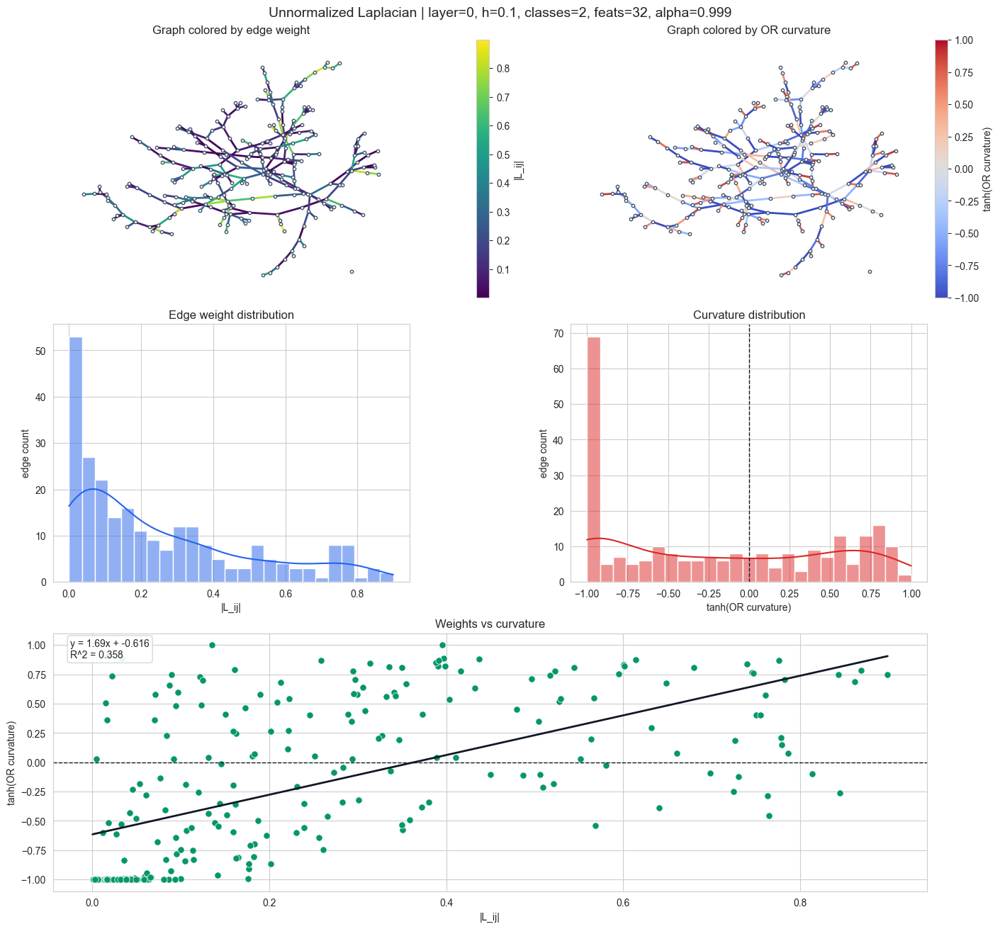

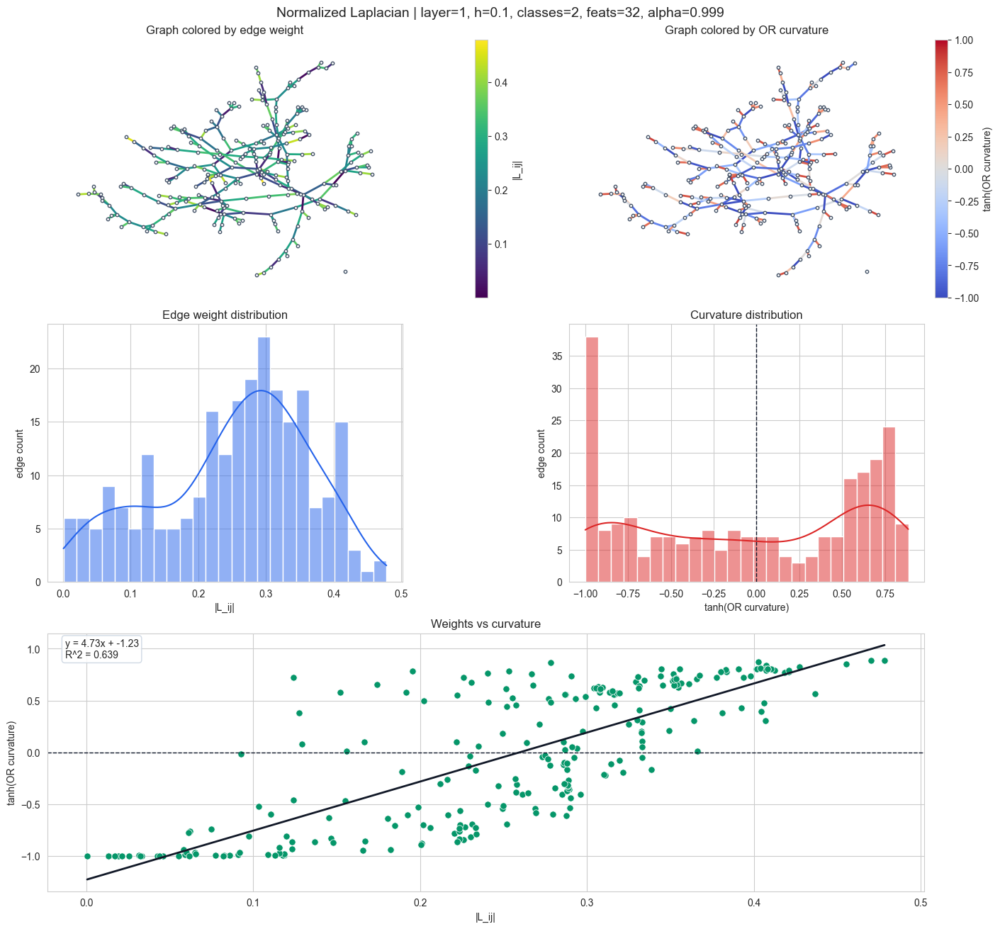

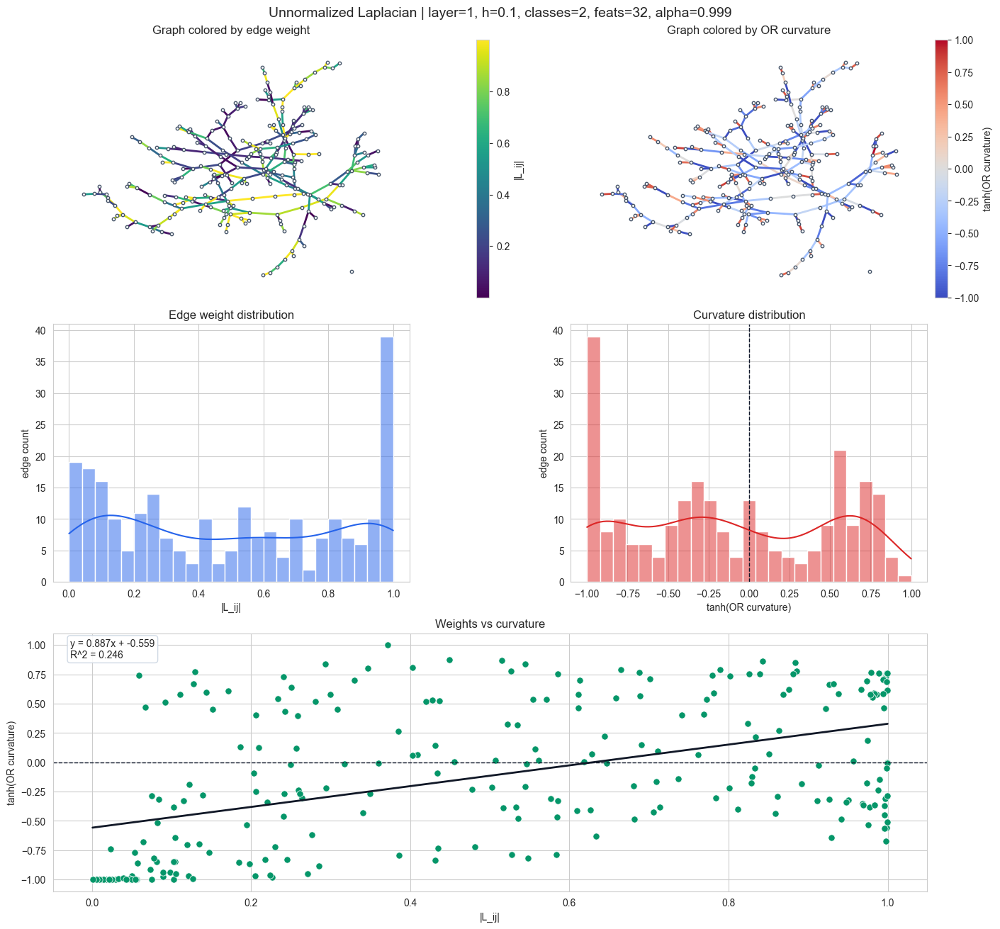

,laplacian,layer,heterophily,num_classes,num_features,edge_count,weight_mean,weight_std,min,mean,median,max,std,nodes,edges,components,alpha,method
0,normalized,0,0.1,2,32,248,0.135458,0.116748,-13425.205913,-119.936442,-0.290635,654.450327,957.998565,250,248,4,0.999,OTD
1,unnormalized,0,0.1,2,32,248,0.247881,0.242713,-267.064166,-4.069334,-0.265156,589.121140,52.386957,250,248,4,0.999,OTD
2,normalized,1,0.1,2,32,248,0.250993,0.112027,-647.526225,-3.310296,-0.022168,1.404873,41.100482,250,248,4,0.999,OTD
3,unnormalized,1,0.1,2,32,248,0.499158,0.348007,-124.514766,-2.208692,-0.197996,92.498053,14.141982,250,248,4,0.999,OTD


In [256]:
# Compute and plot one compact slide for each selected synthetic configuration.
synthetic_or_results = {}
synthetic_or_summary_rows = []

laplacian_choices = {
    "normalized": "norm_Laplacian",
    "unnormalized": "unnorm_Laplacian",
}

for combination in sorted(var_combinations_dict):
    layer, het_coef, num_classes, num_feats = combination

    for laplacian_label, laplacian_key in laplacian_choices.items():
        _, edge_weights_dict, _ = weights_retrieval(L=laplacian_key, parameters_combination=combination)
        graph = build_weighted_graph_from_laplacian_edges(edge_weights_dict)
        result = compute_graph_ollivier_ricci(graph, alpha=GRAPH_RICCI_PLOT_ALPHA)

        result_key = (combination, laplacian_label)
        synthetic_or_results[result_key] = result

        title = (
            f"{laplacian_label.title()} Laplacian | layer={layer}, "
            f"h={het_coef}, classes={num_classes}, feats={num_feats}, "
            f"alpha={GRAPH_RICCI_PLOT_ALPHA:g}"
        )
        plot_synthetic_or_slide(result["graph"], result["edge_curvature"], title)

        weights = np.array(list(edge_weights_dict.values()), dtype=float)
        synthetic_or_summary_rows.append({
            "laplacian": laplacian_label,
            "layer": layer,
            "heterophily": het_coef,
            "num_classes": num_classes,
            "num_features": num_feats,
            "edge_count": graph.number_of_edges(),
            "weight_mean": float(weights.mean()),
            "weight_std": float(weights.std()),
            **result["summary"],
        })

synthetic_or_summary = pd.DataFrame(synthetic_or_summary_rows)
display(synthetic_or_summary)

### 7.5 Synthetic Dataset Exploration

We are interested in understanding in how do features, classes, weights and curvature outputs interplay with each other

#### 7.5.1 Functions

In [257]:
def fetch_synthetic_dataset(dataset_root=None, dataset_name=DATASET):
    """Load the saved synthetic PyG dataset without regenerating it."""
    if dataset_root is None:
        dataset_root = globals().get("working_directory", Path.cwd()) / "datasets"
    dataset_root = Path(dataset_root)
    candidates = [
        dataset_root / dataset_name / "processed" / "data.pt",
        dataset_root / dataset_name / "raw" / "synthetic_data.pt",
    ]

    for path in candidates:
        if not path.exists():
            continue

        loaded = torch.load(path, weights_only=False)
        data = loaded[0] if isinstance(loaded, (tuple, list)) else loaded
        return data, path

    raise FileNotFoundError(f"No saved synthetic dataset found under {dataset_root / dataset_name}.")


def undirected_edges_from_data(data):
    """Return sorted undirected edges from a PyG edge_index tensor."""
    edge_index = data.edge_index.detach().cpu().numpy()
    edges = {
        tuple(sorted((int(u), int(v))))
        for u, v in edge_index.T
        if int(u) != int(v)
    }

    return np.array(sorted(edges), dtype=int)


def analyse_synthetic_dataset(data):
    """Build overview, node, class and feature summaries for one PyG dataset."""
    x = data.x.detach().cpu().numpy()
    y = data.y.detach().cpu().numpy().astype(int)
    edges = undirected_edges_from_data(data)
    degree = np.bincount(edges.ravel(), minlength=x.shape[0]) if len(edges) else np.zeros(x.shape[0], dtype=int)

    x_centered = x - x.mean(axis=0, keepdims=True)
    if min(x_centered.shape) >= 2:
        _, _, vt = np.linalg.svd(x_centered, full_matrices=False)
        pc = x_centered @ vt[:2].T
    else:
        pc = np.zeros((x.shape[0], 2))

    node_df = pd.DataFrame({
        "node": np.arange(x.shape[0]),
        "class": y,
        "degree": degree,
        "feature_norm": np.linalg.norm(x, axis=1),
        "pc1": pc[:, 0],
        "pc2": pc[:, 1],
    })

    same_class = np.array([y[u] == y[v] for u, v in edges], dtype=bool) if len(edges) else np.array([], dtype=bool)
    overview = pd.DataFrame([{
        "nodes": x.shape[0],
        "features": x.shape[1],
        "classes": int(np.unique(y).size),
        "undirected_edges": int(len(edges)),
        "mean_degree": float(degree.mean()),
        "edge_homophily": float(same_class.mean()) if len(same_class) else np.nan,
    }])

    class_summary = (
        node_df.groupby("class", as_index=False)
        .agg(nodes=("node", "count"), mean_degree=("degree", "mean"), mean_feature_norm=("feature_norm", "mean"))
    )
    feature_summary = pd.DataFrame(x).describe().T.rename_axis("feature").reset_index()

    return overview, node_df, class_summary, feature_summary

#### 7.5.2 Fetching

In [258]:
synthetic_data, synthetic_dataset_path = fetch_synthetic_dataset()
dataset_overview, node_df, class_summary, feature_summary = analyse_synthetic_dataset(synthetic_data)

print(f"Loaded synthetic dataset from: {synthetic_dataset_path}")
display(dataset_overview)
display(class_summary)
display(feature_summary.head(16))

Loaded synthetic dataset from: /Users/luigifracassetti/projects/neural-sheaf-diffusion/datasets/synthetic_exp/processed/data.pt


,nodes,features,classes,undirected_edges,mean_degree,edge_homophily
0,250,32,2,248,1.984,0.927419


,class,nodes,mean_degree,mean_feature_norm
0,0,116,2.086207,0.506050
1,1,134,1.895522,0.758014


,feature,count,mean,std,min,25%,50%,75%,max
0,0,250.0,-0.006669,0.522895,-0.954218,-0.420260,1.690338e-02,0.449004,0.956788
1,1,250.0,0.010724,0.247115,-0.469865,-0.161607,8.720633e-03,0.206332,0.485237
2,2,250.0,0.018758,0.274828,-0.845620,-0.110722,1.149443e-02,0.172219,0.850078
3,3,250.0,-0.008049,0.069432,-0.295603,-0.021727,-1.253424e-03,0.011272,0.293931
4,4,250.0,-0.001455,0.131693,-0.703912,-0.027193,2.556238e-04,0.035660,0.451935
5,5,250.0,-0.001359,0.075781,-0.429071,-0.013468,1.107716e-04,0.010185,0.315269
6,6,250.0,-0.002557,0.042749,-0.375078,-0.002612,5.063062e-07,0.002662,0.242135
7,7,250.0,-0.000271,0.026629,-0.134137,-0.003635,2.293886e-05,0.002639,0.142802
8,8,250.0,-0.001431,0.024961,-0.302723,-0.000784,-1.920687e-06,0.000830,0.129497
9,9,250.0,0.000583,0.013821,-0.072804,-0.000721,-4.024234e-06,0.000482,0.092593


#### 7.5.3 Classes Analysis

In [259]:
WEIGHT_SCATTER_NORMALIZATION = globals().get("WEIGHT_SCATTER_NORMALIZATION", None)


def build_feature_edge_frame(data, curvature_result, tanh_scale=GRAPH_RICCI_TANH_SCALE):
    """Create an edge-level table joining features, classes, weights and curvature."""
    x = data.x.detach().cpu().numpy()
    y = data.y.detach().cpu().numpy().astype(int)
    edges, weights, curvatures = edge_plot_values(curvature_result["graph"], curvature_result["edge_curvature"])
    shown_curvatures = np.tanh(curvatures) if tanh_scale else curvatures

    rows = []
    for (u, v), weight, curvature, shown_curvature in zip(edges, weights, curvatures, shown_curvatures):
        if max(u, v) >= len(y):
            continue
        source_class, target_class = int(y[u]), int(y[v])
        source_norm = float(np.linalg.norm(x[u]))
        target_norm = float(np.linalg.norm(x[v]))
        cosine_denom = source_norm * target_norm
        rows.append({
            "source": int(u),
            "target": int(v),
            "source_class": source_class,
            "target_class": target_class,
            "class_pair": "-".join(map(str, sorted((source_class, target_class)))),
            "same_class": source_class == target_class,
            "source_feature_norm": source_norm,
            "target_feature_norm": target_norm,
            "feature_norm_diff": abs(source_norm - target_norm),
            "feature_distance": float(np.linalg.norm(x[u] - x[v])),
            "feature_cosine": float(np.dot(x[u], x[v]) / cosine_denom) if cosine_denom > 0 else np.nan,
            "weight": float(weight),
            "curvature": float(curvature),
            "shown_curvature": float(shown_curvature),
        })

    return pd.DataFrame(rows)


def correlation_value(x, y):
    """Pearson correlation for two numeric arrays, robust to constant vectors."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    valid = np.isfinite(x) & np.isfinite(y)
    if valid.sum() < 2 or np.std(x[valid]) == 0 or np.std(y[valid]) == 0:
        return np.nan
    return float(np.corrcoef(x[valid], y[valid])[0, 1])


def linear_fit_metrics(x, y):
    """Return slope, intercept, R^2 and Pearson r for a simple linear fit."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    valid = np.isfinite(x) & np.isfinite(y)
    if valid.sum() < 2:
        return np.nan, np.nan, np.nan, np.nan

    x, y = x[valid], y[valid]
    slope, intercept = np.polyfit(x, y, deg=1)
    y_hat = slope * x + intercept
    ss_res = np.sum((y - y_hat) ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)
    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan
    return float(slope), float(intercept), float(r2), correlation_value(x, y)


def add_metric_fit(ax, x, y, color="#111827"):
    """Add a fit line annotated only with R^2 and Pearson r."""
    slope, intercept, r2, pearson_r = linear_fit_metrics(x, y)
    if not np.isfinite(slope):
        return r2, pearson_r

    x = np.asarray(x, dtype=float)
    valid = np.isfinite(x) & np.isfinite(y)
    x_line = np.linspace(x[valid].min(), x[valid].max(), 100)
    ax.plot(x_line, slope * x_line + intercept, color=color, linewidth=2)
    ax.text(
        0.02,
        0.98,
        f"R^2 = {r2:.3f}\nr = {pearson_r:.3f}",
        transform=ax.transAxes,
        ha="left",
        va="top",
        bbox={"boxstyle": "round,pad=0.3", "facecolor": "white", "edgecolor": "#cbd5e1", "alpha": 0.9},
    )
    return r2, pearson_r


def normalise_values(values, mode=None):
    """Optionally normalise values for scatter plots only."""
    values = np.asarray(values, dtype=float)
    if mode is None:
        return values, "|L_ij|"
    if mode == "minmax":
        span = values.max() - values.min()
        return (values - values.min()) / span if span > 0 else values * 0, "min-max |L_ij|"
    if mode == "zscore":
        std = values.std()
        return (values - values.mean()) / std if std > 0 else values * 0, "z-score |L_ij|"
    if mode == "log1p":
        return np.log1p(values), "log(1 + |L_ij|)"
    raise ValueError("WEIGHT_SCATTER_NORMALIZATION must be None, 'minmax', 'zscore' or 'log1p'.")


def draw_node_class_graph(graph, node_df, positions, ax, node_size=14):
    """Draw topology with node colors set by class label."""
    node_classes = node_df.set_index("node").reindex(list(graph.nodes()))["class"].to_numpy()
    nx.draw_networkx_edges(graph, positions, edge_color="#cbd5e1", width=.8, alpha=0.6, ax=ax)
    nodes = nx.draw_networkx_nodes(
        graph,
        positions,
        node_color=node_classes,
        cmap=plt.cm.tab10,
        node_size=node_size,
        edgecolors="#0f172a",
        linewidths=0.2,
        ax=ax,
    )
    ax.set_title("Classes on nodes")
    ax.axis("off")
    plt.colorbar(nodes, ax=ax, fraction=0.046, pad=0.02, label="class")


def draw_basic_edge_graph(graph, positions, edges, values, ax, title, cmap, label, vmin=None, vmax=None, node_size=3):
    """Draw fixed topology with edges colored by one metric."""
    nx.draw_networkx_nodes(graph, positions, node_size=node_size, node_color="black", ax=ax, alpha=0.4)
    edge_collection = nx.draw_networkx_edges(
        graph,
        positions,
        edgelist=edges,
        edge_color=values,
        edge_cmap=cmap,
        edge_vmin=vmin,
        edge_vmax=vmax,
        width=1.6,
        ax=ax,
    )
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(edge_collection, ax=ax, fraction=0.046, pad=0.02, label=label)


def plot_basic_synthetic_dataset_views(
    data,
    node_df,
    curvature_result,
    title,
    bins=25,
    curvature_name="OR curvature",
    tanh_scale=GRAPH_RICCI_TANH_SCALE,
):
    """Plot graph weights/classes/curvature plus distributions and compact correlation metrics."""
    graph = curvature_result["graph"]
    edges, weights, curvatures = edge_plot_values(graph, curvature_result["edge_curvature"])
    shown_curvatures = np.tanh(curvatures) if tanh_scale else curvatures
    curvature_label = f"tanh({curvature_name})" if tanh_scale else curvature_name
    scatter_weights, scatter_weight_label = normalise_values(weights, WEIGHT_SCATTER_NORMALIZATION)

    fig, ax = plt.subplot_mosaic(
        [["weights_graph", "curvature_graph", "classes"], ["weight_hist", "curvature_hist", "correlation"]],
        figsize=(18, 9),
        constrained_layout=True,
    )
    positions = nx.spring_layout(graph, seed=SEED, weight=None)

    draw_basic_edge_graph(graph, positions, edges, weights, ax["weights_graph"], "Weights on edges", plt.cm.viridis, "|L_ij|")
    draw_basic_edge_graph(
        graph,
        positions,
        edges,
        shown_curvatures,
        ax["curvature_graph"],
        "Curvature on edges",
        plt.cm.coolwarm,
        curvature_label,
        -1 if tanh_scale else None,
        1 if tanh_scale else None,
    )
    draw_node_class_graph(graph, node_df, positions, ax["classes"])

    sns.histplot(weights, bins=bins, kde=True, color="#2563eb", ax=ax["weight_hist"])
    sns.histplot(shown_curvatures, bins=bins, kde=True, color="#dc2626", ax=ax["curvature_hist"])
    sns.scatterplot(x=scatter_weights, y=shown_curvatures, s=35, color="#059669", edgecolor="white", ax=ax["correlation"])
    _, pearson_r = add_metric_fit(ax["correlation"], scatter_weights, shown_curvatures)

    ax["weight_hist"].set(title="Weight distribution", xlabel="|L_ij|", ylabel="edge count")
    ax["curvature_hist"].axvline(0, color="#0f172a", linestyle="--", linewidth=1)
    ax["curvature_hist"].set(title="Curvature distribution", xlabel=curvature_label, ylabel="edge count")
    ax["correlation"].axhline(0, color="#0f172a", linestyle="--", linewidth=1)
    ax["correlation"].set(title=f"Weights vs curvature (r={pearson_r:.3f})", xlabel=scatter_weight_label, ylabel=curvature_label)

    fig.suptitle(title, fontsize=14)
    plt.show()


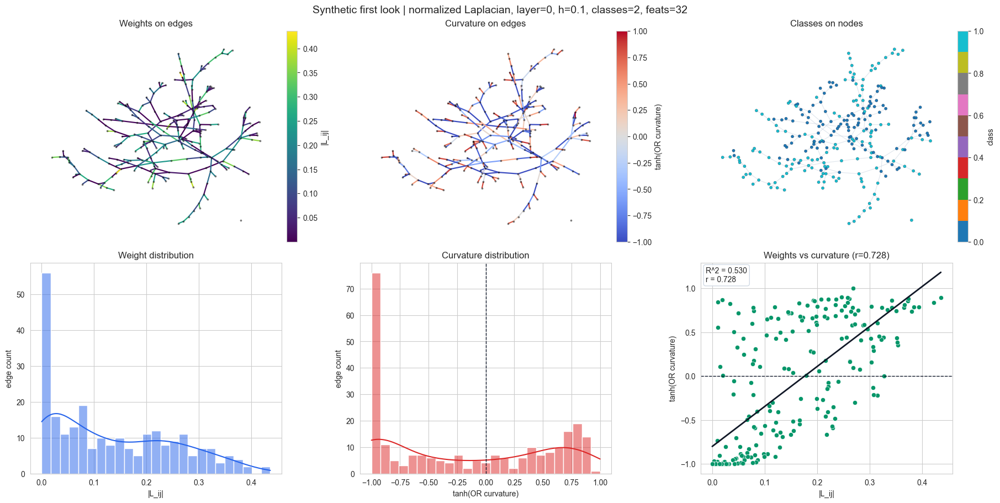

Synthetic first look | normalized Laplacian, layer=0, h=0.1, classes=2, feats=32


,laplacian,layer,source,target,source_class,target_class,same_class,feature_distance,feature_norm_diff,feature_cosine,weight,shown_curvature
0,normalized,0,0,69,1,1,True,0.339835,0.045046,0.932357,0.271728,-0.298305
1,normalized,0,0,134,1,1,True,1.586167,0.200710,-0.787311,0.003275,-1.000000
2,normalized,0,0,169,1,1,True,0.582159,0.297966,0.792005,0.200194,-0.368101
3,normalized,0,1,9,0,0,True,0.840038,0.030717,-0.450901,0.053054,-0.801196
4,normalized,0,1,98,0,0,True,0.609503,0.005493,0.289107,0.172660,0.669081
5,normalized,0,1,136,0,0,True,0.297742,0.027338,0.820294,0.221549,-0.075799
6,normalized,0,2,122,0,0,True,0.941395,0.144830,-0.257927,0.000340,-0.999998
7,normalized,0,3,62,1,1,True,0.772961,0.309553,0.575901,0.217896,-0.665591
8,normalized,0,3,137,1,1,True,0.438170,0.067365,0.885544,0.334016,0.755554
9,normalized,0,3,145,1,1,True,1.813542,0.008319,-0.880733,0.105616,-0.886218


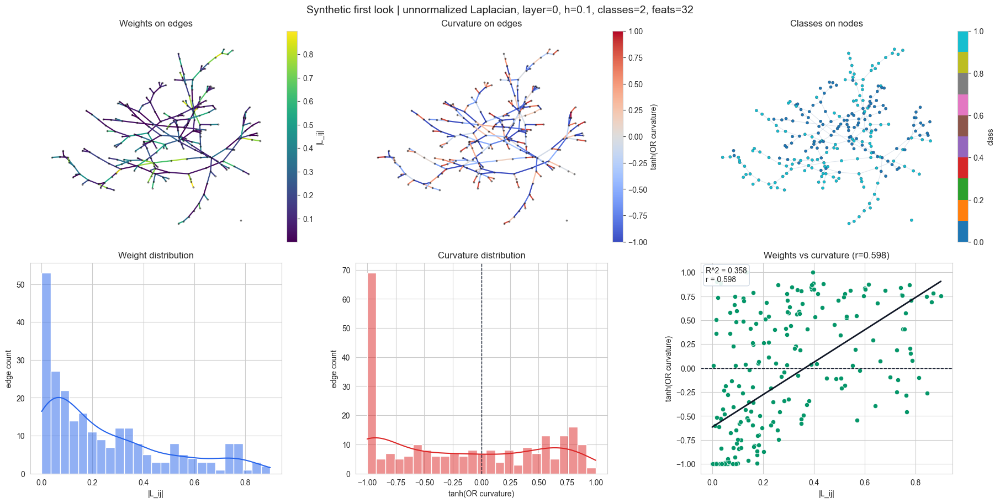

Synthetic first look | unnormalized Laplacian, layer=0, h=0.1, classes=2, feats=32


,laplacian,layer,source,target,source_class,target_class,same_class,feature_distance,feature_norm_diff,feature_cosine,weight,shown_curvature
0,unnormalized,0,0,69,1,1,True,0.339835,0.045046,0.932357,0.763077,-0.283999
1,unnormalized,0,0,134,1,1,True,1.586167,0.200710,-0.787311,0.008931,-1.000000
2,unnormalized,0,0,169,1,1,True,0.582159,0.297966,0.792005,0.358380,-0.488866
3,unnormalized,0,1,9,0,0,True,0.840038,0.030717,-0.450901,0.159617,-0.197679
4,unnormalized,0,1,98,0,0,True,0.609503,0.005493,0.289107,0.299662,0.576509
5,unnormalized,0,1,136,0,0,True,0.297742,0.027338,0.820294,0.506372,-0.104275
6,unnormalized,0,2,122,0,0,True,0.941395,0.144830,-0.257927,0.033380,0.887427
7,unnormalized,0,3,62,1,1,True,0.772961,0.309553,0.575901,0.569002,-0.542357
8,unnormalized,0,3,137,1,1,True,0.438170,0.067365,0.885544,0.649060,0.677630
9,unnormalized,0,3,145,1,1,True,1.813542,0.008319,-0.880733,0.301288,-0.325448


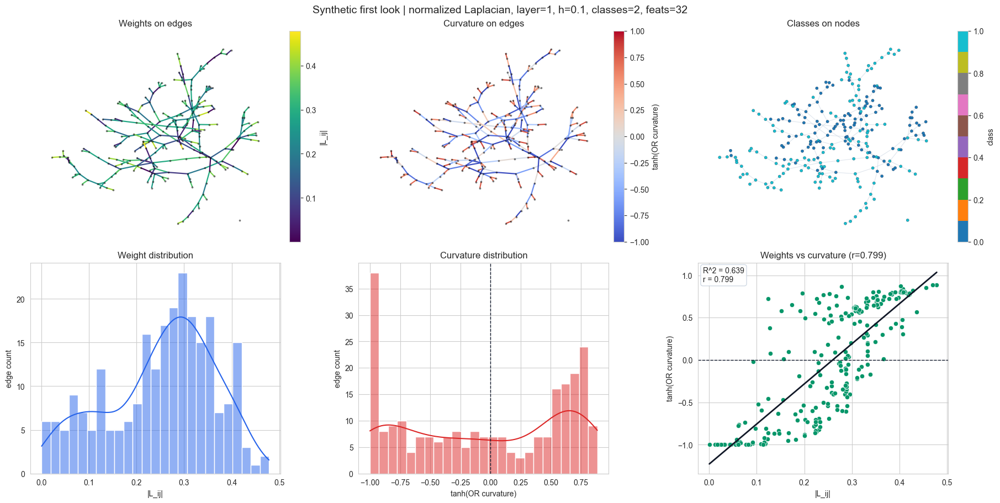

Synthetic first look | normalized Laplacian, layer=1, h=0.1, classes=2, feats=32


,laplacian,layer,source,target,source_class,target_class,same_class,feature_distance,feature_norm_diff,feature_cosine,weight,shown_curvature
0,normalized,1,0,69,1,1,True,0.339835,0.045046,0.932357,0.043922,-0.999996
1,normalized,1,0,134,1,1,True,1.586167,0.200710,-0.787311,0.127708,0.380063
2,normalized,1,0,169,1,1,True,0.582159,0.297966,0.792005,0.338629,-0.166237
3,normalized,1,1,9,0,0,True,0.840038,0.030717,-0.450901,0.226097,0.724877
4,normalized,1,1,98,0,0,True,0.609503,0.005493,0.289107,0.062141,-0.759873
5,normalized,1,1,136,0,0,True,0.297742,0.027338,0.820294,0.216750,-0.602385
6,normalized,1,2,122,0,0,True,0.941395,0.144830,-0.257927,0.406809,0.826403
7,normalized,1,3,62,1,1,True,0.772961,0.309553,0.575901,0.226011,-0.840180
8,normalized,1,3,137,1,1,True,0.438170,0.067365,0.885544,0.352937,0.675240
9,normalized,1,3,145,1,1,True,1.813542,0.008319,-0.880733,0.296033,-0.402848


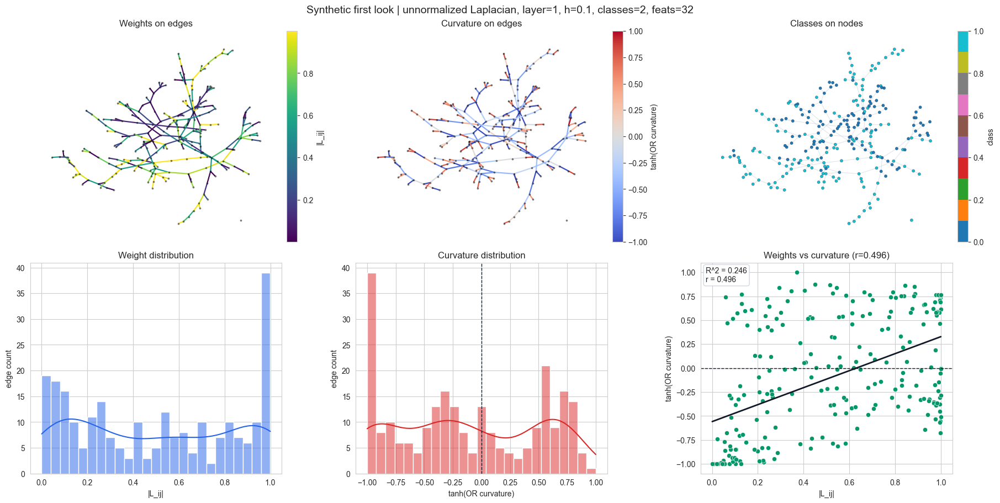

Synthetic first look | unnormalized Laplacian, layer=1, h=0.1, classes=2, feats=32


,laplacian,layer,source,target,source_class,target_class,same_class,feature_distance,feature_norm_diff,feature_cosine,weight,shown_curvature
0,unnormalized,1,0,69,1,1,True,0.339835,0.045046,0.932357,0.102794,-1.000000
1,unnormalized,1,0,134,1,1,True,1.586167,0.200710,-0.787311,0.801483,0.736692
2,unnormalized,1,0,169,1,1,True,0.582159,0.297966,0.792005,0.609055,-0.413901
3,unnormalized,1,1,9,0,0,True,0.840038,0.030717,-0.450901,0.258310,0.394385
4,unnormalized,1,1,98,0,0,True,0.609503,0.005493,0.289107,0.209056,0.123271
5,unnormalized,1,1,136,0,0,True,0.297742,0.027338,0.820294,0.646772,-0.010706
6,unnormalized,1,2,122,0,0,True,0.941395,0.144830,-0.257927,0.143470,0.595010
7,unnormalized,1,3,62,1,1,True,0.772961,0.309553,0.575901,0.975283,-0.531609
8,unnormalized,1,3,137,1,1,True,0.438170,0.067365,0.885544,0.781408,0.593598
9,unnormalized,1,3,145,1,1,True,1.813542,0.008319,-0.880733,0.995517,-0.373847


,laplacian,layer,source,target,source_class,target_class,same_class,feature_distance,feature_norm_diff,feature_cosine,weight,shown_curvature
0,normalized,0,0,69,1,1,True,0.339835,0.045046,0.932357,0.271728,-0.298305
1,normalized,0,0,134,1,1,True,1.586167,0.200710,-0.787311,0.003275,-1.000000
2,normalized,0,0,169,1,1,True,0.582159,0.297966,0.792005,0.200194,-0.368101
3,normalized,0,1,9,0,0,True,0.840038,0.030717,-0.450901,0.053054,-0.801196
4,normalized,0,1,98,0,0,True,0.609503,0.005493,0.289107,0.172660,0.669081
5,normalized,0,1,136,0,0,True,0.297742,0.027338,0.820294,0.221549,-0.075799
6,normalized,0,2,122,0,0,True,0.941395,0.144830,-0.257927,0.000340,-0.999998
7,normalized,0,3,62,1,1,True,0.772961,0.309553,0.575901,0.217896,-0.665591
8,normalized,0,3,137,1,1,True,0.438170,0.067365,0.885544,0.334016,0.755554
9,normalized,0,3,145,1,1,True,1.813542,0.008319,-0.880733,0.105616,-0.886218


In [260]:
if not globals().get("synthetic_or_results"):
    raise RuntimeError("Run section 7.4 first, so synthetic_or_results contains curvature outputs.")

feature_edge_columns = [
    "laplacian",
    "layer",
    "source",
    "target",
    "source_class",
    "target_class",
    "same_class",
    "feature_distance",
    "feature_norm_diff",
    "feature_cosine",
    "weight",
    "shown_curvature",
]

synthetic_feature_edge_tables = {}
feature_edge_frames = []

for (combination, laplacian_label), result in synthetic_or_results.items():
    layer, het_coef, num_classes, num_feats = combination
    edge_df = build_feature_edge_frame(synthetic_data, result)
    edge_df.insert(0, "laplacian", laplacian_label)
    edge_df.insert(1, "layer", layer)
    edge_df.insert(2, "heterophily", het_coef)
    synthetic_feature_edge_tables[(combination, laplacian_label)] = edge_df
    feature_edge_frames.append(edge_df)

    title = (
        f"Synthetic first look | {laplacian_label} Laplacian, layer={layer}, "
        f"h={het_coef}, classes={num_classes}, feats={num_feats}"
    )
    plot_basic_synthetic_dataset_views(synthetic_data, node_df, result, title)

    print(title)
    display(edge_df[feature_edge_columns].head(20))

synthetic_feature_edge_analysis = pd.concat(feature_edge_frames, ignore_index=True)
display(synthetic_feature_edge_analysis[feature_edge_columns].head(50))


#### 7.5.4 Features Exploration

In [261]:
x = synthetic_data.x.detach().cpu().numpy()
feature_cols = [f"feature_{i}" for i in range(x.shape[1])]
synthetic_node_feature_table = pd.DataFrame(x, columns=feature_cols)
synthetic_node_feature_table.insert(0, "node", np.arange(x.shape[0]))
synthetic_node_feature_table.insert(1, "class", synthetic_data.y.detach().cpu().numpy().astype(int))
synthetic_node_feature_table["degree"] = node_df["degree"].to_numpy()
synthetic_node_feature_table["feature_norm"] = np.linalg.norm(x, axis=1)

print("Dataset overview")
display(dataset_overview)
print("Node-feature table")
display(synthetic_node_feature_table.head(20))
print("Feature summary")
display(feature_summary)

feature_class_summary = (
    synthetic_node_feature_table.groupby("class")[["degree", "feature_norm"]]
    .agg(["count", "mean", "std", "min", "max"])
    .round(4)
)
display(feature_class_summary)

feature_edge_summary = (
    synthetic_feature_edge_analysis.groupby(["laplacian", "layer", "same_class"], as_index=False)
    .agg(
        edges=("weight", "count"),
        mean_feature_distance=("feature_distance", "mean"),
        mean_feature_cosine=("feature_cosine", "mean"),
        mean_weight=("weight", "mean"),
        mean_curvature=("shown_curvature", "mean"),
    )
)
display(feature_edge_summary)

Dataset overview


,nodes,features,classes,undirected_edges,mean_degree,edge_homophily
0,250,32,2,248,1.984,0.927419


Node-feature table


,node,class,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,...,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,degree,feature_norm
0,0,1,0.922997,0.089871,-0.132931,-0.004774,-0.029043,-0.047925,0.003606,-0.009418,...,-2.577830e-08,-6.244754e-09,4.271743e-09,3.167602e-09,4.135246e-09,3.872313e-09,-1.526148e-09,1.477157e-11,3,0.938586
1,1,0,-0.416422,0.073120,0.215587,0.020209,0.018976,-0.054205,0.005849,0.015563,...,-2.580896e-06,-2.603493e-06,2.874611e-08,-3.708030e-07,-1.944714e-07,-8.505303e-07,1.927929e-08,8.957726e-08,3,0.508402
2,2,0,0.086775,0.210865,0.048000,-0.211042,-0.583304,-0.029915,-0.003409,-0.000412,...,-2.347235e-11,-2.208290e-10,-2.109691e-11,1.707191e-11,4.714952e-12,-1.275718e-11,-2.884096e-12,2.639342e-11,1,0.663315
3,3,1,-0.928280,0.096327,0.076575,-0.003516,-0.028804,-0.066547,-0.002038,0.006962,...,-2.758020e-09,2.952872e-09,-2.306957e-09,1.731553e-09,-7.537464e-11,9.108986e-11,-1.167060e-11,3.781316e-12,3,0.939239
4,4,1,0.187878,-0.268027,-0.365720,-0.055038,0.033680,0.066528,-0.020426,0.045450,...,-1.568062e-06,7.851635e-07,-2.221403e-06,7.056463e-07,-7.399883e-08,-5.650482e-08,1.450648e-08,1.407093e-09,2,0.502084
5,5,1,-0.150436,0.454033,-0.292060,0.000512,-0.000076,-0.000019,-0.000003,-0.000089,...,1.877633e-07,4.412157e-07,4.278824e-07,1.805058e-07,1.485774e-07,-2.473561e-07,6.558997e-08,6.113081e-09,1,0.560425
6,6,0,-0.468716,-0.068885,0.097879,-0.014721,0.006468,-0.001265,0.011227,-0.005976,...,4.300055e-06,1.230972e-06,6.120092e-07,-1.729025e-07,1.299199e-06,3.860341e-07,-9.771900e-08,2.246259e-07,5,0.484194
7,7,1,-0.451257,0.052071,0.633880,-0.031794,-0.147124,-0.015332,-0.002959,0.001202,...,-1.296289e-12,2.373195e-12,-8.090211e-13,1.563512e-12,1.928348e-12,-1.977887e-12,1.777784e-13,2.911807e-14,1,0.794390
8,8,0,0.012051,0.148380,-0.175155,-0.263918,-0.492621,0.040682,0.046814,-0.008563,...,3.609660e-08,7.885030e-10,-6.204321e-11,-6.022891e-11,-4.389112e-11,-1.092396e-10,-4.682773e-11,4.394448e-11,1,0.608123
9,9,0,0.243538,0.376131,-0.151902,-0.029304,-0.053322,0.022576,0.006971,0.006303,...,-2.002647e-07,-2.727159e-07,-3.596250e-08,-1.786449e-08,1.779853e-08,1.989835e-07,9.381198e-09,8.951902e-08,1,0.477685


Feature summary


,feature,count,mean,std,min,25%,50%,75%,max
0,0,250.0,-6.668903e-03,5.228955e-01,-9.542180e-01,-4.202601e-01,1.690338e-02,4.490044e-01,0.956788
1,1,250.0,1.072428e-02,2.471147e-01,-4.698654e-01,-1.616068e-01,8.720633e-03,2.063318e-01,0.485237
2,2,250.0,1.875755e-02,2.748281e-01,-8.456200e-01,-1.107223e-01,1.149443e-02,1.722190e-01,0.850078
3,3,250.0,-8.048788e-03,6.943217e-02,-2.956026e-01,-2.172723e-02,-1.253424e-03,1.127228e-02,0.293931
4,4,250.0,-1.454903e-03,1.316930e-01,-7.039123e-01,-2.719339e-02,2.556238e-04,3.565969e-02,0.451935
5,5,250.0,-1.359299e-03,7.578143e-02,-4.290713e-01,-1.346791e-02,1.107716e-04,1.018498e-02,0.315269
6,6,250.0,-2.556950e-03,4.274874e-02,-3.750783e-01,-2.612471e-03,5.063062e-07,2.661872e-03,0.242135
7,7,250.0,-2.709732e-04,2.662910e-02,-1.341375e-01,-3.634743e-03,2.293886e-05,2.639322e-03,0.142802
8,8,250.0,-1.430770e-03,2.496113e-02,-3.027227e-01,-7.840199e-04,-1.920687e-06,8.299338e-04,0.129497
9,9,250.0,5.826075e-04,1.382081e-02,-7.280446e-02,-7.207594e-04,-4.024234e-06,4.815676e-04,0.092593


degree                         feature_norm                          \
       count    mean     std min max        count    mean     std     min   
class                                                                       
0        116  2.0862  1.1464   1   6          116  0.5061  0.0495  0.4439   
1        134  1.8955  0.9907   0   5          134  0.7580  0.1536  0.3431   

               
          max  
class          
0      0.7491  
1      0.9568

,laplacian,layer,same_class,edges,mean_feature_distance,mean_feature_cosine,mean_weight,mean_curvature
0,normalized,0,False,18,0.845338,0.009343,0.124622,-0.180019
1,normalized,0,True,230,0.840060,0.012277,0.136306,-0.184983
2,normalized,1,False,18,0.845338,0.009343,0.172743,-0.502009
3,normalized,1,True,230,0.840060,0.012277,0.257117,-0.004802
4,unnormalized,0,False,18,0.845338,0.009343,0.245533,-0.446232
5,unnormalized,0,True,230,0.840060,0.012277,0.248065,-0.176540
6,unnormalized,1,False,18,0.845338,0.009343,0.514730,-0.268999
7,unnormalized,1,True,230,0.840060,0.012277,0.497939,-0.103941


#### 7.5.5 Heterophily-based analysis

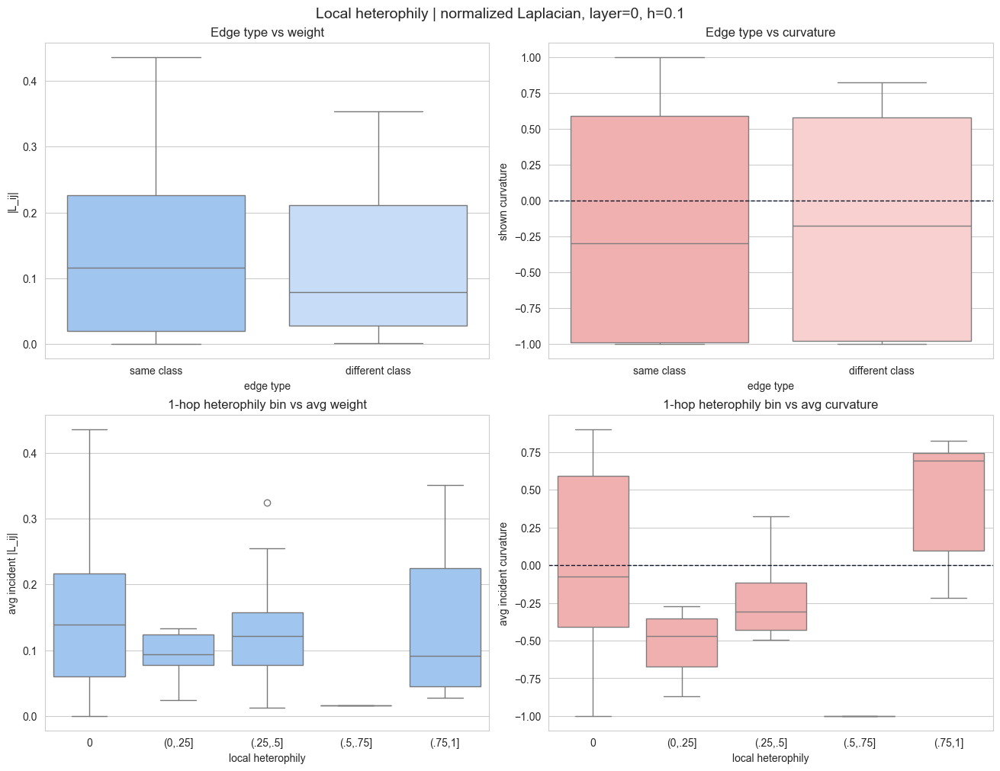

,laplacian,layer,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,normalized,0,0,1,3,0.0,0.158399,-0.555469,0
1,normalized,0,1,0,3,0.0,0.149088,-0.069304,0
2,normalized,0,2,0,1,0.0,0.000340,-0.999998,0
3,normalized,0,3,1,3,0.0,0.219176,-0.265418,0
4,normalized,0,4,1,2,0.5,0.039926,-0.129456,"(.25,.5]"
5,normalized,0,5,1,1,1.0,0.033529,0.822759,"(.75,1]"
6,normalized,0,6,0,5,0.4,0.150507,-0.462231,"(.25,.5]"
7,normalized,0,7,1,1,0.0,0.246617,0.749447,0
8,normalized,0,8,0,1,0.0,0.192625,0.863321,0
9,normalized,0,9,0,1,0.0,0.053054,-0.801196,0


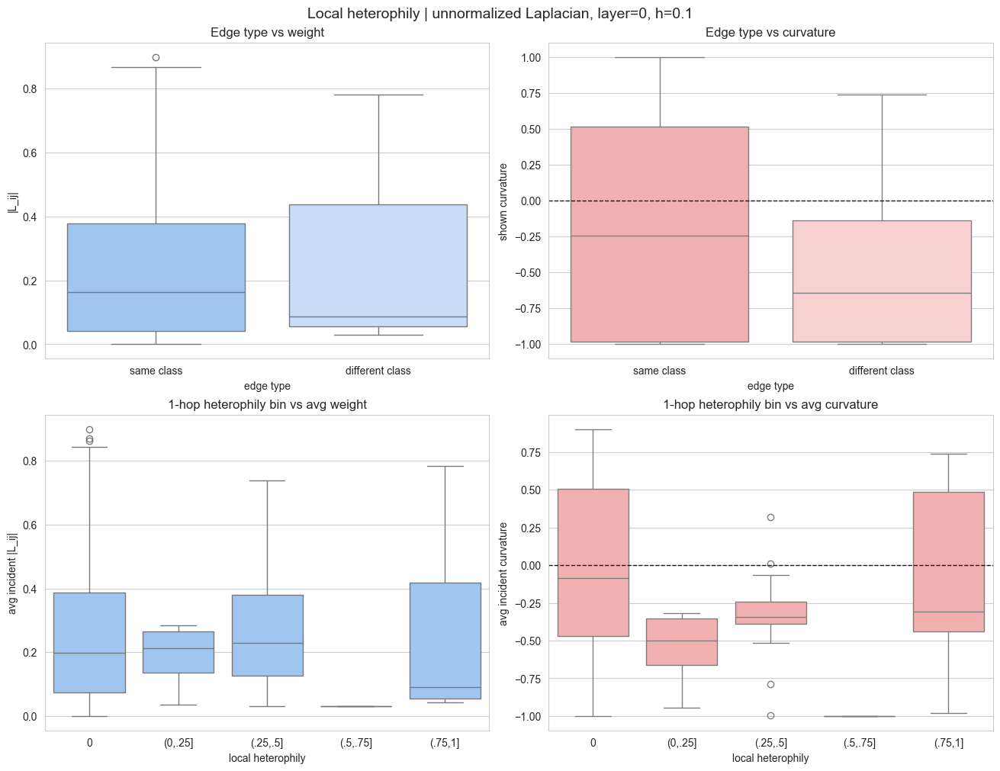

,laplacian,layer,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,unnormalized,0,0,1,3,0.0,0.376796,-0.590955,0
1,unnormalized,0,1,0,3,0.0,0.321884,0.091518,0
2,unnormalized,0,2,0,1,0.0,0.033380,0.887427,0
3,unnormalized,0,3,1,3,0.0,0.506450,-0.063392,0
4,unnormalized,0,4,1,2,0.5,0.031693,-0.992933,"(.25,.5]"
5,unnormalized,0,5,1,1,1.0,0.053250,-0.185840,"(.75,1]"
6,unnormalized,0,6,0,5,0.4,0.378258,-0.252006,"(.25,.5]"
7,unnormalized,0,7,1,1,0.0,0.544264,0.809882,0
8,unnormalized,0,8,0,1,0.0,0.032612,-0.527248,0
9,unnormalized,0,9,0,1,0.0,0.159617,-0.197679,0


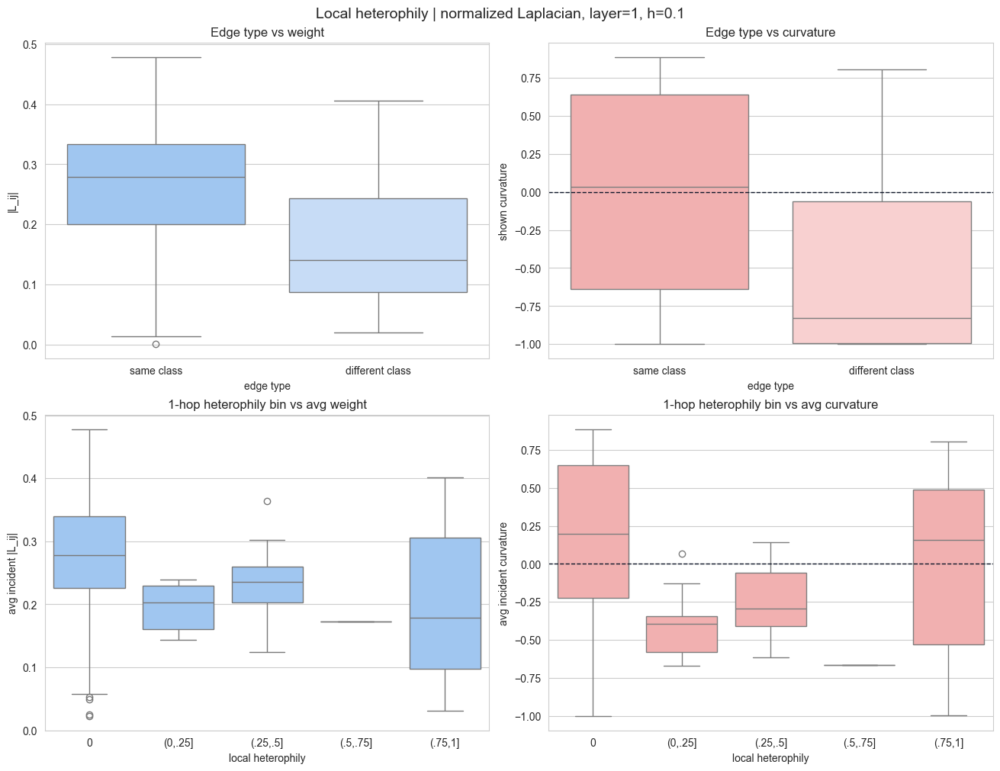

,laplacian,layer,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,normalized,1,0,1,3,0.0,0.170087,-0.262057,0
1,normalized,1,1,0,3,0.0,0.168329,-0.212460,0
2,normalized,1,2,0,1,0.0,0.406809,0.826403,0
3,normalized,1,3,1,3,0.0,0.291660,-0.189263,0
4,normalized,1,4,1,2,0.5,0.209721,-0.262017,"(.25,.5]"
5,normalized,1,5,1,1,1.0,0.401389,0.803193,"(.75,1]"
6,normalized,1,6,0,5,0.4,0.182489,-0.384981,"(.25,.5]"
7,normalized,1,7,1,1,0.0,0.412609,0.792219,0
8,normalized,1,8,0,1,0.0,0.365840,0.712075,0
9,normalized,1,9,0,1,0.0,0.226097,0.724877,0


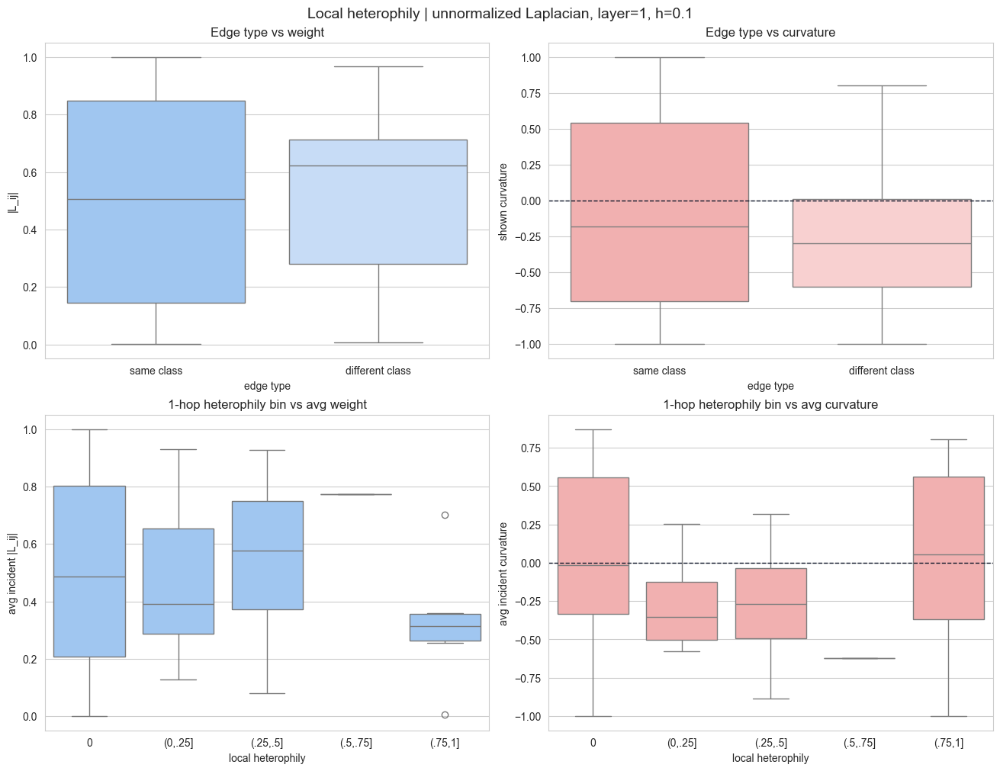

,laplacian,layer,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,unnormalized,1,0,1,3,0.0,0.504444,-0.225736,0
1,unnormalized,1,1,0,3,0.0,0.371380,0.168983,0
2,unnormalized,1,2,0,1,0.0,0.143470,0.595010,0
3,unnormalized,1,3,1,3,0.0,0.917403,-0.103953,0
4,unnormalized,1,4,1,2,0.5,0.428533,-0.610248,"(.25,.5]"
5,unnormalized,1,5,1,1,1.0,0.005338,-1.000000,"(.75,1]"
6,unnormalized,1,6,0,5,0.4,0.549737,-0.239733,"(.25,.5]"
7,unnormalized,1,7,1,1,0.0,0.998053,0.734257,0
8,unnormalized,1,8,0,1,0.0,0.779563,0.741958,0
9,unnormalized,1,9,0,1,0.0,0.258310,0.394385,0


,laplacian,layer,class,nodes,mean_local_heterophily,mean_1hop_weight,mean_1hop_curvature
0,normalized,0,0,116,0.050000,0.093215,-0.221876
1,normalized,0,1,134,0.075815,0.184977,0.083124
2,normalized,1,0,116,0.050000,0.262648,0.112195
3,normalized,1,1,134,0.075815,0.269674,0.129048
4,unnormalized,0,0,116,0.050000,0.146694,-0.152629
5,unnormalized,0,1,134,0.075815,0.344745,-0.041972
6,unnormalized,1,0,116,0.050000,0.277819,-0.172430
7,unnormalized,1,1,134,0.075815,0.690142,0.145266


In [262]:
def build_local_heterophily_frame(edge_df, node_df):
    """Summarise each node's 1-hop class mismatch, average weight and average curvature."""
    rows = []
    for node, node_class in node_df[["node", "class"]].itertuples(index=False):
        incident = edge_df[(edge_df["source"] == node) | (edge_df["target"] == node)]
        rows.append({
            "node": int(node),
            "class": int(node_class),
            "laplacian_degree": int(len(incident)),
            "local_heterophily": float((~incident["same_class"]).mean()) if len(incident) else np.nan,
            "avg_1hop_weight": float(incident["weight"].mean()) if len(incident) else np.nan,
            "avg_1hop_curvature": float(incident["shown_curvature"].mean()) if len(incident) else np.nan,
        })
    local_df = pd.DataFrame(rows)
    local_df["heterophily_bin"] = pd.cut(
        local_df["local_heterophily"],
        bins=[-0.001, 0.0, 0.25, 0.5, 0.75, 1.0],
        labels=["0", "(0,.25]", "(.25,.5]", "(.5,.75]", "(.75,1]"],
    )
    return local_df


def plot_local_heterophily_analysis(edge_df, local_df, title):
    """Use grouped distributions instead of noisy node-level scatter plots."""
    edge_view = edge_df.assign(edge_type=np.where(edge_df["same_class"], "same class", "different class"))
    fig, ax = plt.subplot_mosaic(
        [["edge_weight", "edge_curvature"], ["node_weight", "node_curvature"]],
        figsize=(13, 10),
        constrained_layout=True,
    )

    sns.boxplot(data=edge_view, x="edge_type", y="weight", hue="edge_type", palette=["#93c5fd", "#bfdbfe"], legend=False, ax=ax["edge_weight"])
    sns.boxplot(data=edge_view, x="edge_type", y="shown_curvature", hue="edge_type", palette=["#fca5a5", "#fecaca"], legend=False, ax=ax["edge_curvature"])
    sns.boxplot(data=local_df.dropna(subset=["heterophily_bin"]), x="heterophily_bin", y="avg_1hop_weight", color="#93c5fd", ax=ax["node_weight"])
    sns.boxplot(data=local_df.dropna(subset=["heterophily_bin"]), x="heterophily_bin", y="avg_1hop_curvature", color="#fca5a5", ax=ax["node_curvature"])

    ax["edge_weight"].set(title="Edge type vs weight", xlabel="edge type", ylabel="|L_ij|")
    ax["edge_curvature"].axhline(0, color="#0f172a", linestyle="--", linewidth=1)
    ax["edge_curvature"].set(title="Edge type vs curvature", xlabel="edge type", ylabel="shown curvature")
    ax["node_weight"].set(title="1-hop heterophily bin vs avg weight", xlabel="local heterophily", ylabel="avg incident |L_ij|")
    ax["node_curvature"].axhline(0, color="#0f172a", linestyle="--", linewidth=1)
    ax["node_curvature"].set(title="1-hop heterophily bin vs avg curvature", xlabel="local heterophily", ylabel="avg incident curvature")

    fig.suptitle(title, fontsize=14)
    plt.show()


synthetic_local_heterophily_tables = {}
local_heterophily_frames = []

for (combination, laplacian_label), edge_df in synthetic_feature_edge_tables.items():
    layer, het_coef, num_classes, num_feats = combination
    local_df = build_local_heterophily_frame(edge_df, node_df)
    local_df.insert(0, "laplacian", laplacian_label)
    local_df.insert(1, "layer", layer)
    synthetic_local_heterophily_tables[(combination, laplacian_label)] = local_df
    local_heterophily_frames.append(local_df)

    title = f"Local heterophily | {laplacian_label} Laplacian, layer={layer}, h={het_coef}"
    plot_local_heterophily_analysis(edge_df, local_df, title)
    display(local_df.head(20))

synthetic_local_heterophily_analysis = pd.concat(local_heterophily_frames, ignore_index=True)
display(
    synthetic_local_heterophily_analysis.groupby(["laplacian", "layer", "class"], as_index=False)
    .agg(
        nodes=("node", "count"),
        mean_local_heterophily=("local_heterophily", "mean"),
        mean_1hop_weight=("avg_1hop_weight", "mean"),
        mean_1hop_curvature=("avg_1hop_curvature", "mean"),
    )
)


## 8. Classical Datasets Analysis

### 8.1 Experiment Launch and Result Retrieval


In [263]:
import re
import shlex
import subprocess
from types import SimpleNamespace

CLASSICAL_DATASETS = ("cornell", "texas", "wisconsin", "cora")
CLASSICAL_SCRIPT_DIR = working_directory / "exp" / "scripts"
CLASSICAL_RUN_EXPERIMENTS = False
CLASSICAL_ENTITY = os.environ.get("ENTITY", "local")

CLASSICAL_DEFAULTS = {
    "cornell": {"model": "DiagSheaf", "stalk_dim": 1, "layers": 2, "hidden": 16, "epochs": 500},
    "texas": {"model": "DiagSheaf", "stalk_dim": 1, "layers": 2, "hidden": 16, "epochs": 500},
    "wisconsin": {"model": "DiagSheaf", "stalk_dim": 1, "layers": 2, "hidden": 16, "epochs": 500},
    "cora": {"model": "DiagSheaf", "stalk_dim": 2, "layers": 2, "hidden": 16, "epochs": 500},
}


def small_dataset_launch_commands(datasets=CLASSICAL_DATASETS):
    """Commands that run the existing scripts through the project .venv."""
    rows = []
    venv_bin = working_directory / ".venv" / "bin"
    for dataset in datasets:
        script = CLASSICAL_SCRIPT_DIR / f"run_{dataset}.sh"
        command = (
            f"cd {shlex.quote(str(working_directory))} && "
            f"ENTITY={shlex.quote(CLASSICAL_ENTITY)} WANDB_MODE=disabled "
            f"PATH={shlex.quote(str(venv_bin))}:$PATH sh {shlex.quote(str(script))}"
        )
        rows.append({"dataset": dataset, "script": str(script), "command": command, "exists": script.exists()})
    return pd.DataFrame(rows)


classical_launch_commands = small_dataset_launch_commands()
display(classical_launch_commands)

if CLASSICAL_RUN_EXPERIMENTS:
    for command in classical_launch_commands["command"]:
        subprocess.run(["bash", "-lc", command], check=True)


def parse_classical_laplacian_path(path):
    """Parse metadata from a saved classical-dataset Laplacian path."""
    path = Path(path)
    match = re.match(r"(?P<model>.+)_(?P<dataset>.+)_layer(?P<layer>\d+)_fold(?P<fold>\d+)_seed(?P<seed>\d+)\.pt", path.name)
    if not match:
        return None

    parts = path.parts
    value_from_suffix = lambda suffix: next((int(p[: -len(suffix)]) for p in parts if p.endswith(suffix) and p[: -len(suffix)].isdigit()), None)
    normalised = next((p.split("-", 1)[1] for p in parts if p.startswith("normalised-")), "legacy")
    stalk_dim = next((int(p.split("-", 1)[1]) for p in parts if p.startswith("stalk_dim-")), None)

    return {
        **match.groupdict(),
        "path": path,
        "normalised": normalised,
        "stalk_dim": stalk_dim,
        "layers": value_from_suffix("-layers"),
        "hidden": value_from_suffix("-hidden"),
        "epochs": value_from_suffix("-epochs"),
        "mtime": path.stat().st_mtime,
    }


def list_classical_laplacians(datasets=CLASSICAL_DATASETS):
    rows = []
    root = working_directory / "results" / "laplacians"
    for dataset in datasets:
        dataset_root = root / dataset
        for path in dataset_root.rglob(f"*_{dataset}_layer*_fold*_seed*.pt") if dataset_root.exists() else []:
            parsed = parse_classical_laplacian_path(path)
            if parsed is not None:
                rows.append(parsed)

    index = pd.DataFrame(rows)
    if index.empty:
        return index

    numeric_cols = ["layer", "fold", "seed", "stalk_dim", "layers", "hidden", "epochs"]
    index[numeric_cols] = index[numeric_cols].apply(pd.to_numeric, errors="coerce")
    return index.sort_values(["dataset", "layers", "layer", "fold", "mtime"], ascending=[True, False, True, True, False])


classical_laplacian_index = list_classical_laplacians()
display(classical_laplacian_index.drop(columns="mtime").head(30))


,dataset,script,command,exists
0,cornell,/Users/luigifracassetti/projects/neural-sheaf-...,cd /Users/luigifracassetti/projects/neural-she...,True
1,texas,/Users/luigifracassetti/projects/neural-sheaf-...,cd /Users/luigifracassetti/projects/neural-she...,True
2,wisconsin,/Users/luigifracassetti/projects/neural-sheaf-...,cd /Users/luigifracassetti/projects/neural-she...,True
3,cora,/Users/luigifracassetti/projects/neural-sheaf-...,cd /Users/luigifracassetti/projects/neural-she...,True


,model,dataset,layer,fold,seed,path,normalised,stalk_dim,layers,hidden,epochs
529,DiagSheaf,cora,0,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,5,16,500
530,DiagSheaf,cora,1,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,5,16,500
533,DiagSheaf,cora,2,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,5,16,500
532,DiagSheaf,cora,3,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,5,16,500
531,DiagSheaf,cora,4,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,5,16,500
526,DiagSheaf,cora,0,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,3,16,500
527,DiagSheaf,cora,1,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,3,16,500
528,DiagSheaf,cora,2,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,legacy,1,3,16,500
535,DiagSheaf,cora,0,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,true,1,2,16,500
555,DiagSheaf,cora,0,0,43,/Users/luigifracassetti/projects/neural-sheaf-...,true,2,2,16,500


### 8.2 Classical OR Analysis


,nodes,features,classes,undirected_edges,mean_degree,edge_homophily,laplacian_path
0,183.0,1703.0,5.0,277.0,3.027322,0.296029,/Users/luigifracassetti/projects/neural-sheaf-...


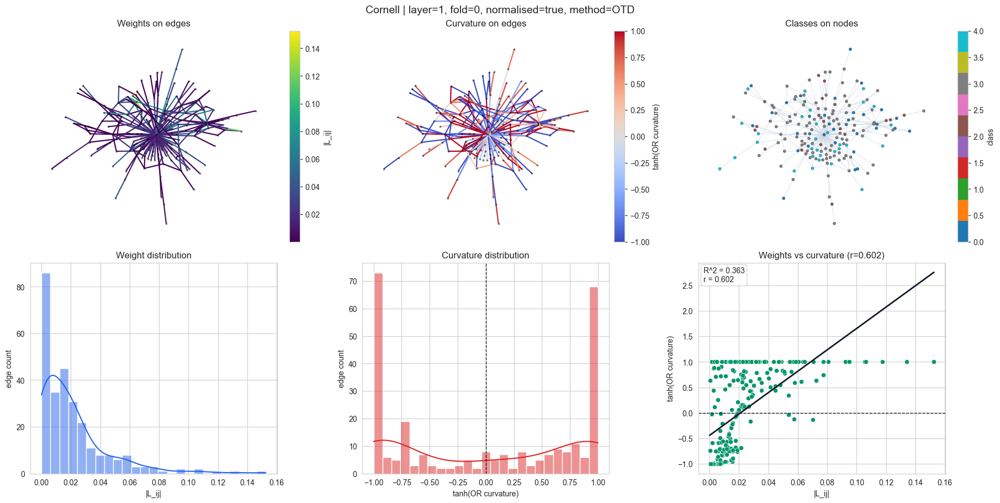

,dataset,layer,fold,source,target,source_class,target_class,same_class,feature_distance,weight,shown_curvature
0,cornell,1,0,0,42,3,0,False,0.156964,0.018607,-0.007458
1,cornell,1,0,1,82,0,2,False,0.085342,0.034153,1.000000
2,cornell,1,0,1,90,0,3,False,0.105255,0.031796,0.790776
3,cornell,1,0,1,99,0,4,False,0.114653,0.017504,1.000000
4,cornell,1,0,1,148,0,3,False,0.134349,0.006994,-0.491538
5,cornell,1,0,2,42,2,0,False,0.184900,0.008566,-0.837674
6,cornell,1,0,3,42,3,0,False,0.144650,0.013804,-0.725048
7,cornell,1,0,3,163,3,3,True,0.127412,0.001457,-0.996907
8,cornell,1,0,4,8,4,3,False,0.125549,0.002149,-1.000000
9,cornell,1,0,4,25,4,1,False,0.137620,0.134069,1.000000


,nodes,features,classes,undirected_edges,mean_degree,edge_homophily,laplacian_path
0,183.0,1703.0,5.0,279.0,3.04918,0.060932,/Users/luigifracassetti/projects/neural-sheaf-...


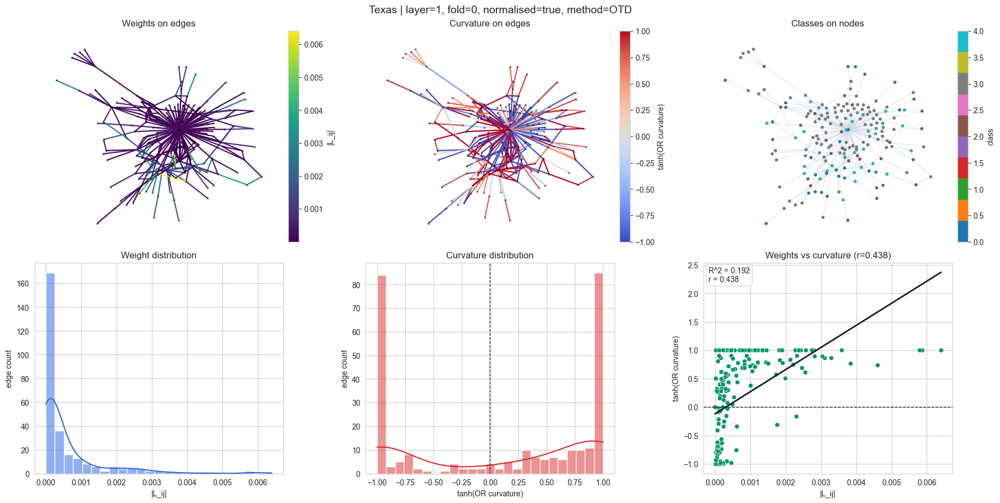

,dataset,layer,fold,source,target,source_class,target_class,same_class,feature_distance,weight,shown_curvature
0,texas,1,0,0,58,3,2,False,0.143867,0.000239,-0.999994
1,texas,1,0,0,121,3,0,False,0.148954,0.002826,0.897210
2,texas,1,0,1,80,0,4,False,0.127850,0.001201,0.784597
3,texas,1,0,2,8,2,3,False,0.198214,0.000010,-0.999998
4,texas,1,0,3,56,3,0,False,0.155854,0.000093,-0.214336
5,texas,1,0,4,66,4,0,False,0.104612,0.001343,1.000000
6,texas,1,0,4,146,4,3,False,0.123993,0.000134,-0.998713
7,texas,1,0,4,164,4,0,False,0.128265,0.001319,1.000000
8,texas,1,0,5,20,3,0,False,0.100712,0.000775,1.000000
9,texas,1,0,5,56,3,0,False,0.138778,0.000004,-1.000000


,nodes,features,classes,undirected_edges,mean_degree,edge_homophily,laplacian_path
0,251.0,1703.0,5.0,450.0,3.585657,0.177778,/Users/luigifracassetti/projects/neural-sheaf-...


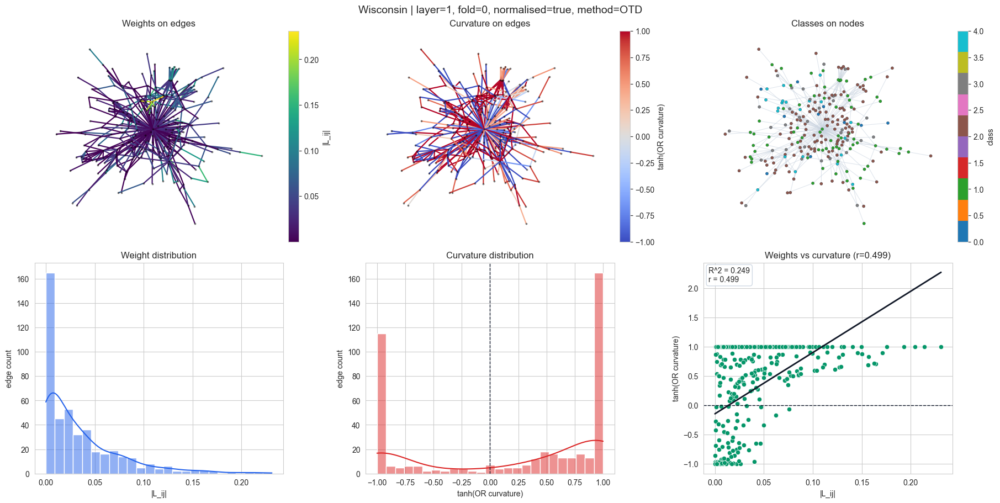

,dataset,layer,fold,source,target,source_class,target_class,same_class,feature_distance,weight,shown_curvature
0,wisconsin,1,0,0,7,1,1,True,0.150231,0.023196,0.027826
1,wisconsin,1,0,0,20,1,1,True,0.150231,0.045756,1.000000
2,wisconsin,1,0,0,28,1,1,True,0.117018,0.013003,-0.639751
3,wisconsin,1,0,0,99,1,2,False,0.152886,0.140833,1.000000
4,wisconsin,1,0,0,104,1,2,False,0.119297,0.040277,1.000000
5,wisconsin,1,0,0,200,1,1,True,0.128118,0.046239,-0.648815
6,wisconsin,1,0,1,98,2,1,False,0.131752,0.030542,0.505710
7,wisconsin,1,0,2,54,2,3,False,0.129369,0.015864,0.650107
8,wisconsin,1,0,2,98,2,1,False,0.132588,0.027379,1.000000
9,wisconsin,1,0,3,52,2,1,False,0.166724,0.085366,0.513153


,nodes,features,classes,undirected_edges,mean_degree,edge_homophily,laplacian_path
0,2708.0,1433.0,7.0,5278.0,3.89808,0.809966,/Users/luigifracassetti/projects/neural-sheaf-...


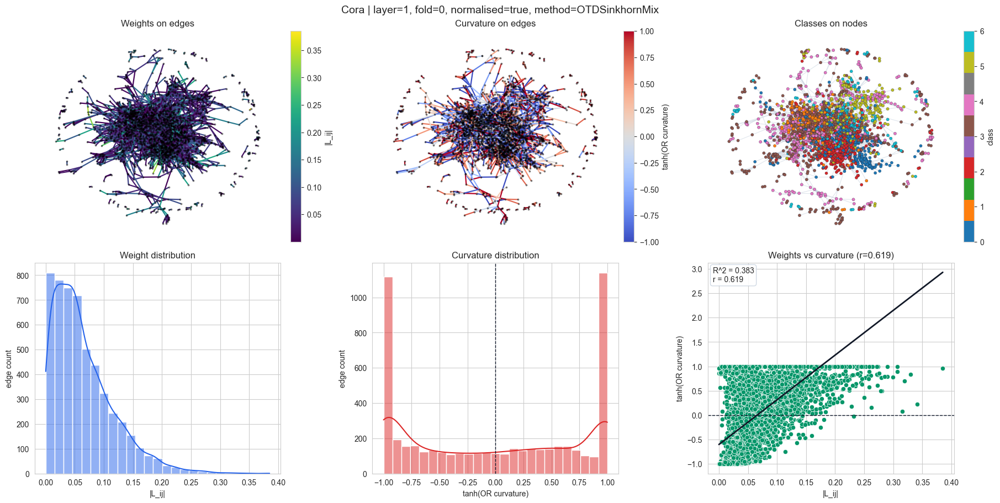

,dataset,layer,fold,source,target,source_class,target_class,same_class,feature_distance,weight,shown_curvature
0,cora,1,0,0,633,3,3,True,0.374634,0.074674,0.470240
1,cora,1,0,0,1862,3,3,True,0.384900,0.080578,0.715099
2,cora,1,0,0,2582,3,3,True,0.389932,0.138921,0.785856
3,cora,1,0,1,2,4,4,True,0.287019,0.014878,-1.000000
4,cora,1,0,1,652,4,4,True,0.253520,0.133778,0.253763
5,cora,1,0,1,654,4,4,True,0.245950,0.219397,0.799612
6,cora,1,0,2,332,4,3,False,0.278932,0.004074,-0.999995
7,cora,1,0,2,1454,4,4,True,0.291913,0.004350,-0.991654
8,cora,1,0,2,1666,4,3,False,0.275060,0.057641,-0.347789
9,cora,1,0,2,1986,4,3,False,0.550120,0.009180,-0.999986


,dataset,layer,fold,normalised,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,cornell,1,0,true,0,42,3,0,0-3,False,0.147442,0.105409,0.042033,0.156964,0.264210,0.018607,-0.007459,-0.007458
1,cornell,1,0,true,1,82,0,2,0-2,False,0.065795,0.082199,0.016404,0.085342,0.351541,0.034153,778.523833,1.000000
2,cornell,1,0,true,1,90,0,3,0-3,False,0.065795,0.103695,0.037900,0.105255,0.293374,0.031796,1.073499,0.790776
3,cornell,1,0,true,1,99,0,4,0-4,False,0.065795,0.110432,0.044636,0.114653,0.232508,0.017504,550.099915,1.000000
4,cornell,1,0,true,1,148,0,3,0-3,False,0.065795,0.130189,0.064394,0.134349,0.188448,0.006994,-0.538086,-0.491538
5,cornell,1,0,true,2,42,2,0,0-2,False,0.196116,0.105409,0.090707,0.184900,0.372104,0.008566,-1.213325,-0.837674
6,cornell,1,0,true,3,42,3,0,0-3,False,0.113961,0.105409,0.008551,0.144650,0.132137,0.013804,-0.918208,-0.725048
7,cornell,1,0,true,3,163,3,3,3-3,True,0.113961,0.100000,0.013961,0.127412,0.296298,0.001457,-3.235166,-0.996907
8,cornell,1,0,true,4,8,4,3,3-4,False,0.106600,0.103695,0.002905,0.125549,0.287403,0.002149,-8.192029,-1.000000
9,cornell,1,0,true,4,25,4,1,1-4,False,0.106600,0.149071,0.042471,0.137620,0.460840,0.134069,537.801748,1.000000


In [264]:
CLASSICAL_LAYER = 1
CLASSICAL_FOLD = 0
CLASSICAL_OTD_NODE_LIMIT = 500


def choose_classical_laplacian(index, dataset, layer=CLASSICAL_LAYER, fold=CLASSICAL_FOLD):
    """Pick the preferred result for one dataset, falling back to any matching saved result."""
    candidates = index[(index["dataset"] == dataset) & (index["layer"] == layer) & (index["fold"] == fold)].copy()
    if candidates.empty:
        raise FileNotFoundError(f"No Laplacian found for {dataset}, layer={layer}, fold={fold}. Run section 8.1 first.")

    defaults = CLASSICAL_DEFAULTS.get(dataset, {})
    candidates["score"] = 0
    for key, value in defaults.items():
        if key in candidates.columns:
            candidates["score"] += (candidates[key] == value).astype(int)
    candidates["score"] += (candidates["normalised"] == "true").astype(int)
    return candidates.sort_values(["score", "mtime"], ascending=False).iloc[0]


def edge_weights_from_laplacian_path(path, num_nodes, stalk_dim=1, reducer="mean"):
    """Collapse sparse sheaf-Laplacian coordinates back to base graph-node edge weights."""
    laplacian = torch.load(path, weights_only=False).detach().cpu()
    rows = laplacian[0].long().numpy()
    cols = laplacian[1].long().numpy()
    values = laplacian[2].abs().numpy()
    stalk_dim = int(stalk_dim or max(1, int(np.ceil((max(rows.max(), cols.max()) + 1) / num_nodes))))

    buckets = {}
    for row, col, value in zip(rows, cols, values):
        u, v = int(row // stalk_dim), int(col // stalk_dim)
        if u == v or u >= num_nodes or v >= num_nodes:
            continue
        edge = tuple(sorted((u, v)))
        buckets.setdefault(edge, []).append(float(value))

    if reducer == "max":
        return {edge: max(vals) for edge, vals in buckets.items()}
    return {edge: float(np.mean(vals)) for edge, vals in buckets.items()}


def fetch_classical_dataset(dataset_name):
    """Load a classical citation/web dataset through the project loader."""
    import sys

    project_root = globals().get("working_directory", Path.cwd())
    if str(project_root) not in sys.path:
        sys.path.insert(0, str(project_root))

    from utils.heterophilic import get_dataset

    return get_dataset(dataset_name, SimpleNamespace())[0]


def compute_classical_curvature_from_laplacian(path, num_nodes, stalk_dim):
    """Build a node-level weighted graph from a saved sheaf Laplacian and compute OR curvature."""
    edge_weights = edge_weights_from_laplacian_path(path, num_nodes=num_nodes, stalk_dim=stalk_dim)
    graph = build_weighted_graph_from_laplacian_edges(edge_weights)
    method = GRAPH_RICCI_METHOD if graph.number_of_nodes() <= CLASSICAL_OTD_NODE_LIMIT else "OTDSinkhornMix"
    return compute_graph_ollivier_ricci(graph, alpha=GRAPH_RICCI_PLOT_ALPHA, method=method)


classical_data_objects = {}
classical_node_tables = {}
classical_or_results = {}
classical_feature_edge_tables = {}

for dataset_name in CLASSICAL_DATASETS:
    data = fetch_classical_dataset(dataset_name)
    overview, classical_node_df, class_df, classical_feature_summary = analyse_synthetic_dataset(data)
    selected = choose_classical_laplacian(classical_laplacian_index, dataset_name)
    result = compute_classical_curvature_from_laplacian(
        selected["path"],
        num_nodes=data.x.shape[0],
        stalk_dim=selected["stalk_dim"],
    )

    edge_df = build_feature_edge_frame(data, result)
    edge_df.insert(0, "dataset", dataset_name)
    edge_df.insert(1, "layer", int(selected["layer"]))
    edge_df.insert(2, "fold", int(selected["fold"]))
    edge_df.insert(3, "normalised", selected["normalised"])

    classical_data_objects[dataset_name] = data
    classical_node_tables[dataset_name] = classical_node_df
    classical_or_results[dataset_name] = result
    classical_feature_edge_tables[dataset_name] = edge_df

    title = f"{dataset_name.title()} | layer={int(selected['layer'])}, fold={int(selected['fold'])}, normalised={selected['normalised']}, method={result['summary']['method']}"
    display(pd.DataFrame([{**overview.iloc[0].to_dict(), "laplacian_path": str(selected["path"])}]))
    plot_basic_synthetic_dataset_views(data, classical_node_df, result, title)
    display(edge_df[["dataset", "layer", "fold", "source", "target", "source_class", "target_class", "same_class", "feature_distance", "weight", "shown_curvature"]].head(20))

classical_feature_edge_analysis = pd.concat(classical_feature_edge_tables.values(), ignore_index=True)
display(classical_feature_edge_analysis.head(50))


### 8.3 Classical Local Heterophily


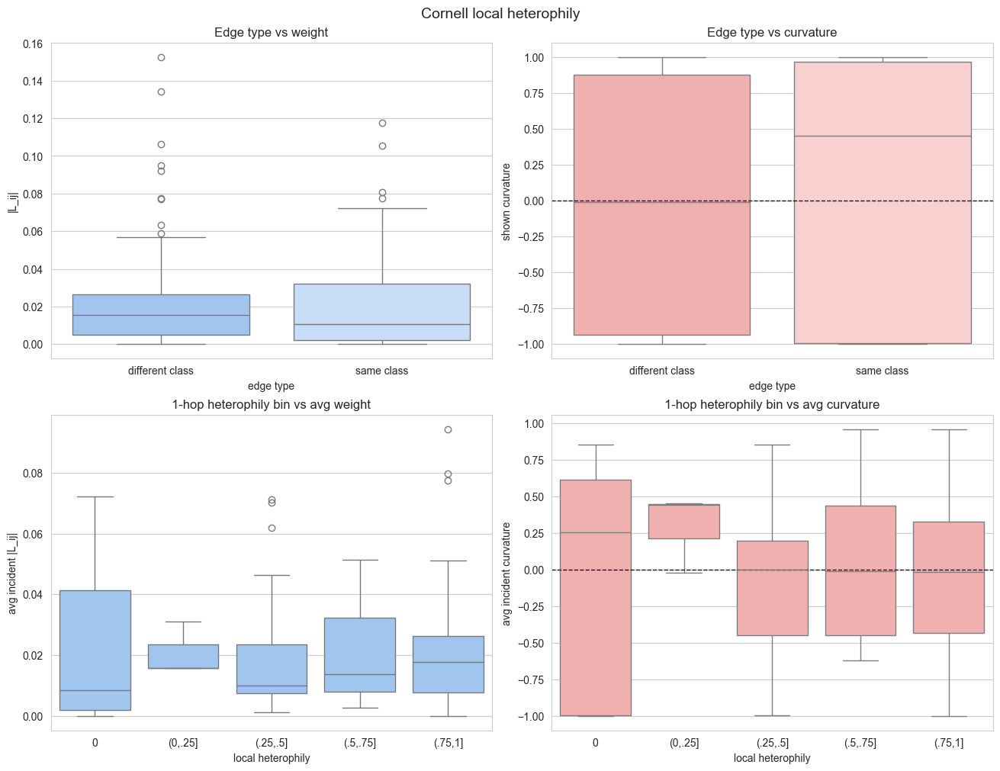

,dataset,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,cornell,0,3,1,1.000000,0.018607,-0.007458,"(.75,1]"
1,cornell,1,0,4,1.000000,0.022612,0.574809,"(.75,1]"
2,cornell,2,2,1,1.000000,0.008566,-0.837674,"(.75,1]"
3,cornell,3,3,2,0.500000,0.007631,-0.860978,"(.25,.5]"
4,cornell,4,4,7,1.000000,0.024534,-0.618795,"(.75,1]"
5,cornell,5,3,2,0.500000,0.022996,0.433055,"(.25,.5]"
6,cornell,6,0,5,0.800000,0.034533,0.572373,"(.75,1]"
7,cornell,7,0,2,0.500000,0.070066,0.838158,"(.25,.5]"
8,cornell,8,3,3,0.666667,0.007968,-0.487571,"(.5,.75]"
9,cornell,9,0,1,0.000000,0.072241,0.638839,0


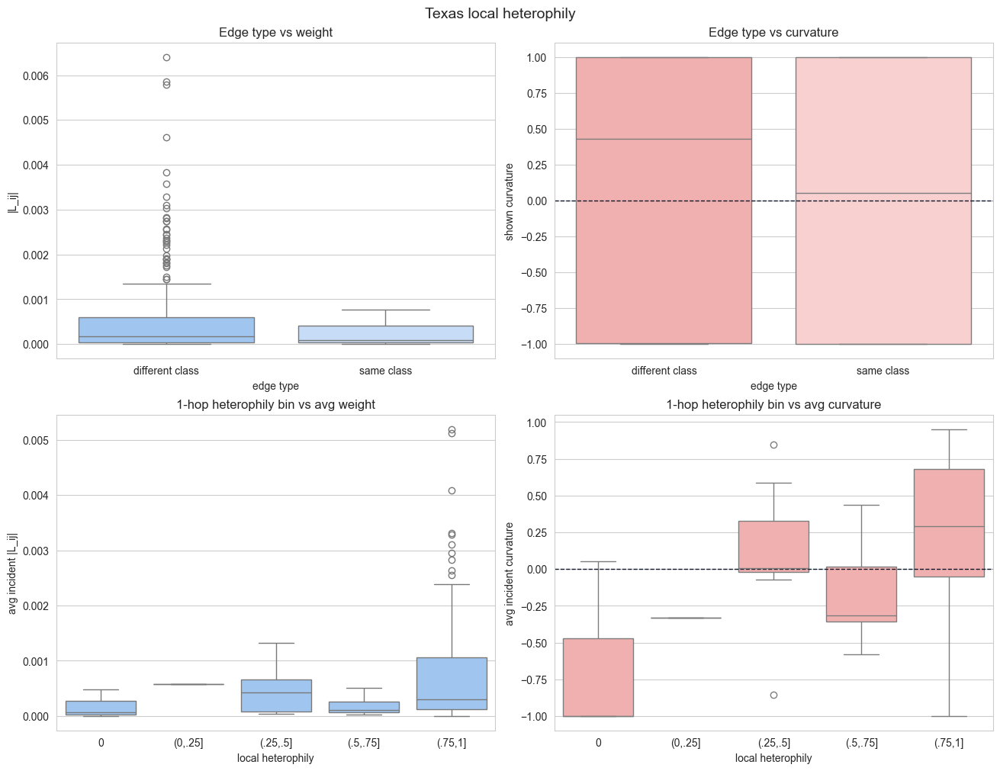

,dataset,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,texas,0,3,2,1.000000,0.001532,-0.051392,"(.75,1]"
1,texas,1,0,1,1.000000,0.001201,0.784597,"(.75,1]"
2,texas,2,2,1,1.000000,0.000010,-0.999998,"(.75,1]"
3,texas,3,3,1,1.000000,0.000093,-0.214336,"(.75,1]"
4,texas,4,4,3,1.000000,0.000932,0.333762,"(.75,1]"
5,texas,5,3,3,1.000000,0.001294,0.288186,"(.75,1]"
6,texas,6,0,2,0.500000,0.001327,0.844367,"(.25,.5]"
7,texas,7,0,2,1.000000,0.002256,0.294727,"(.75,1]"
8,texas,8,3,2,1.000000,0.000090,-0.869113,"(.75,1]"
9,texas,9,0,2,0.500000,0.000718,0.237986,"(.25,.5]"


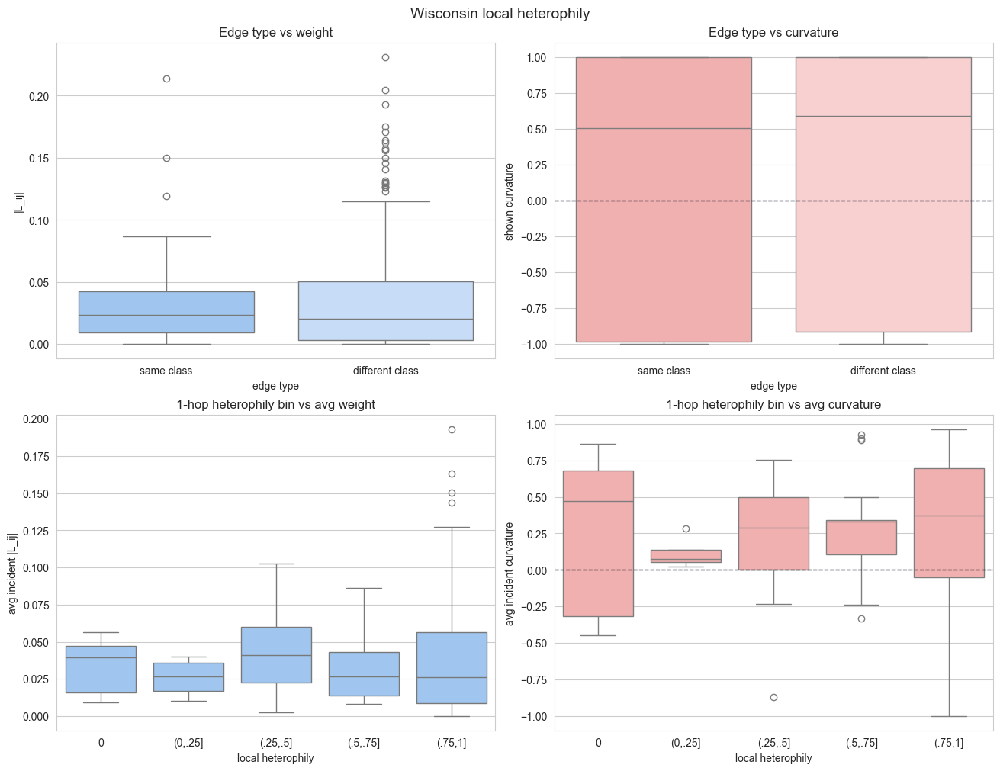

,dataset,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,wisconsin,0,1,6,0.333333,0.051551,0.289877,"(.25,.5]"
1,wisconsin,1,2,1,1.000000,0.030542,0.505710,"(.75,1]"
2,wisconsin,2,2,2,1.000000,0.021621,0.825053,"(.75,1]"
3,wisconsin,3,2,3,1.000000,0.099461,0.698064,"(.75,1]"
4,wisconsin,4,1,2,0.500000,0.048823,-0.230138,"(.25,.5]"
5,wisconsin,5,1,10,0.900000,0.057579,0.438940,"(.75,1]"
6,wisconsin,6,1,3,0.333333,0.006841,0.333333,"(.25,.5]"
7,wisconsin,7,1,2,0.000000,0.021964,-0.180758,0
8,wisconsin,8,2,3,1.000000,0.064520,0.794239,"(.75,1]"
9,wisconsin,9,0,1,1.000000,0.001018,-0.999743,"(.75,1]"


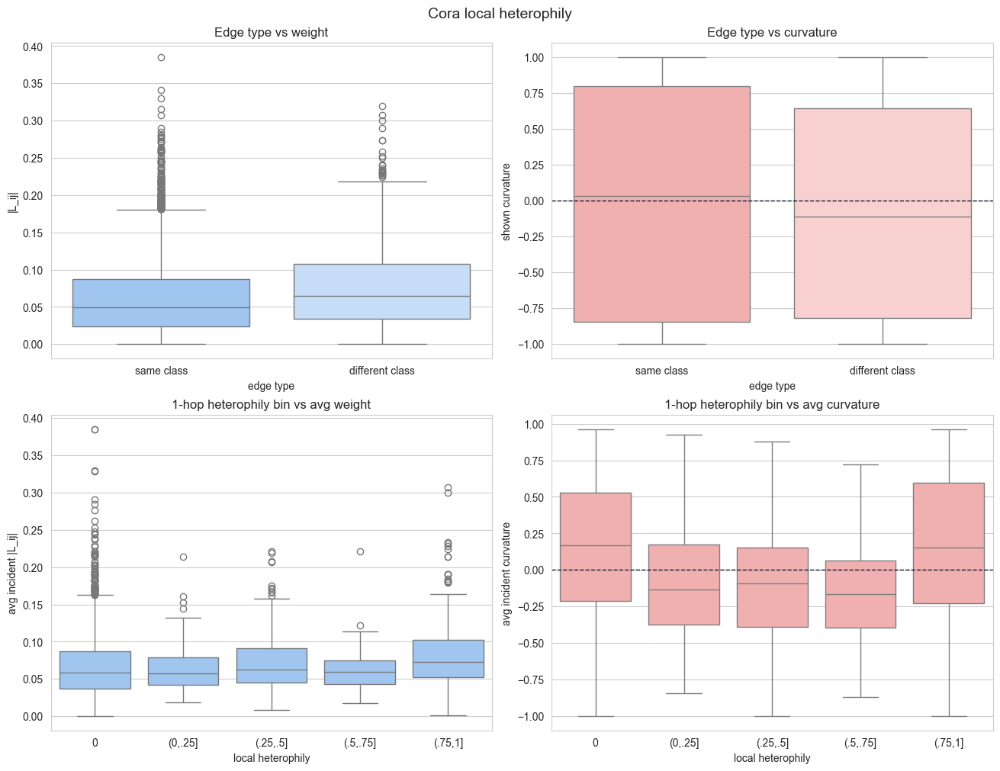

,dataset,node,class,laplacian_degree,local_heterophily,avg_1hop_weight,avg_1hop_curvature,heterophily_bin
0,cora,0,3,3,0.0,0.098058,0.657065,0
1,cora,1,4,3,0.0,0.122684,0.017792,0
2,cora,2,4,5,0.6,0.018024,-0.867884,"(.5,.75]"
3,cora,3,0,1,0.0,0.126857,0.964028,0
4,cora,4,3,5,0.4,0.096345,0.399811,"(.25,.5]"
5,cora,5,2,3,0.0,0.097889,0.320145,0
6,cora,6,0,4,0.0,0.050840,0.158966,0
7,cora,7,3,1,0.0,0.385106,0.964028,0
8,cora,8,3,3,0.0,0.041125,-0.513979,0
9,cora,9,2,2,0.0,0.064104,0.083948,0


,dataset,class,nodes,mean_local_heterophily,mean_1hop_weight,mean_1hop_curvature
0,cora,0,351,0.256675,0.065776,-0.039420
1,cora,1,217,0.231331,0.068487,0.140454
2,cora,2,418,0.083037,0.084415,0.137369
3,cora,3,818,0.161476,0.066058,0.097761
4,cora,4,426,0.151158,0.074713,0.100184
5,cora,5,298,0.214429,0.059236,-0.024578
6,cora,6,180,0.211616,0.053729,0.114120
7,cornell,0,33,0.637841,0.042622,0.555447
8,cornell,1,1,1.000000,0.094314,0.959287
9,cornell,2,18,0.879630,0.009883,-0.278099


In [265]:
classical_local_heterophily_tables = {}

for dataset_name, edge_df in classical_feature_edge_tables.items():
    local_df = build_local_heterophily_frame(edge_df, classical_node_tables[dataset_name])
    local_df.insert(0, "dataset", dataset_name)
    classical_local_heterophily_tables[dataset_name] = local_df

    plot_local_heterophily_analysis(edge_df, local_df, f"{dataset_name.title()} local heterophily")
    display(local_df.head(20))

classical_local_heterophily_analysis = pd.concat(classical_local_heterophily_tables.values(), ignore_index=True)
display(
    classical_local_heterophily_analysis.groupby(["dataset", "class"], as_index=False)
    .agg(
        nodes=("node", "count"),
        mean_local_heterophily=("local_heterophily", "mean"),
        mean_1hop_weight=("avg_1hop_weight", "mean"),
        mean_1hop_curvature=("avg_1hop_curvature", "mean"),
    )
)


## 9. Forman-Ricci (or Forman-Bochner) Curvature

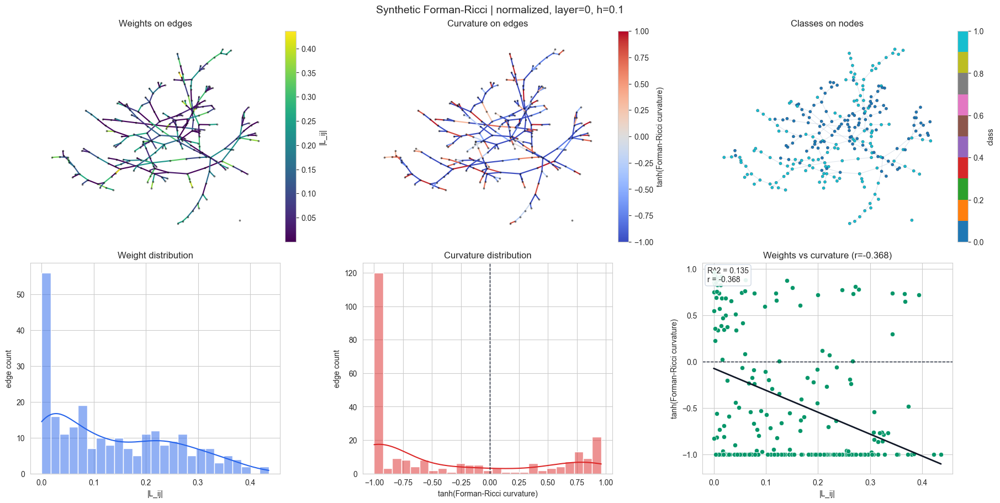

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,normalized,0,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.271728,-13.943370,-1.000000
1,normalized,0,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.003275,1.762315,0.942761
2,normalized,0,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.200194,-8.777662,-1.000000
3,normalized,0,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.053054,0.956319,0.742630
4,normalized,0,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.172660,-0.686791,-0.595917
5,normalized,0,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.221549,-18.230409,-1.000000
6,normalized,0,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.000340,1.754570,0.941893
7,normalized,0,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.217896,-4.746728,-0.999849
8,normalized,0,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.334016,-1.016465,-0.768423
9,normalized,0,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.105616,-0.200391,-0.197751


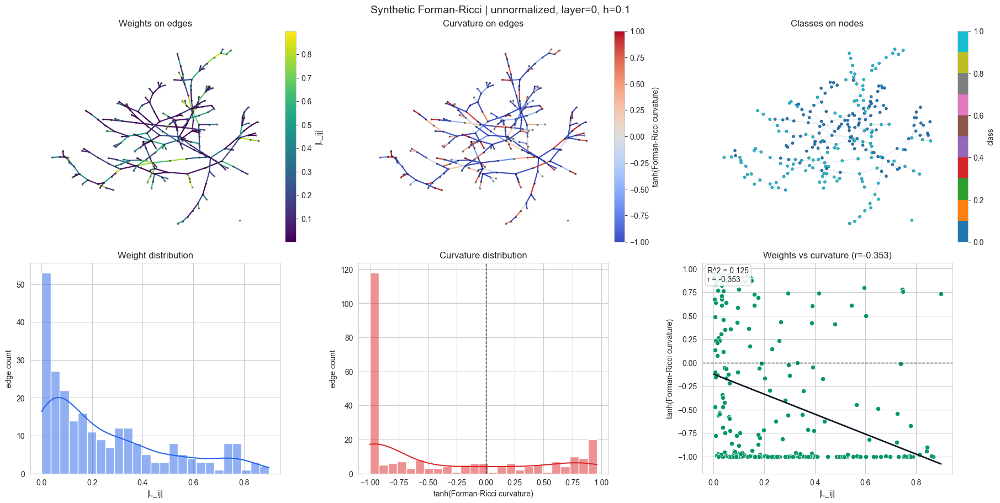

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,unnormalized,0,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.763077,-16.633448,-1.000000
1,unnormalized,0,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.008931,1.733955,0.939522
2,unnormalized,0,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.358380,-6.912203,-0.999998
3,unnormalized,0,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.159617,0.708723,0.609876
4,unnormalized,0,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.299662,-0.139449,-0.138552
5,unnormalized,0,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.506372,-7.378465,-0.999999
6,unnormalized,0,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.033380,-0.357057,-0.342620
7,unnormalized,0,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.569002,-5.278238,-0.999948
8,unnormalized,0,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.649060,-0.535783,-0.489789
9,unnormalized,0,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.301288,-23.130184,-1.000000


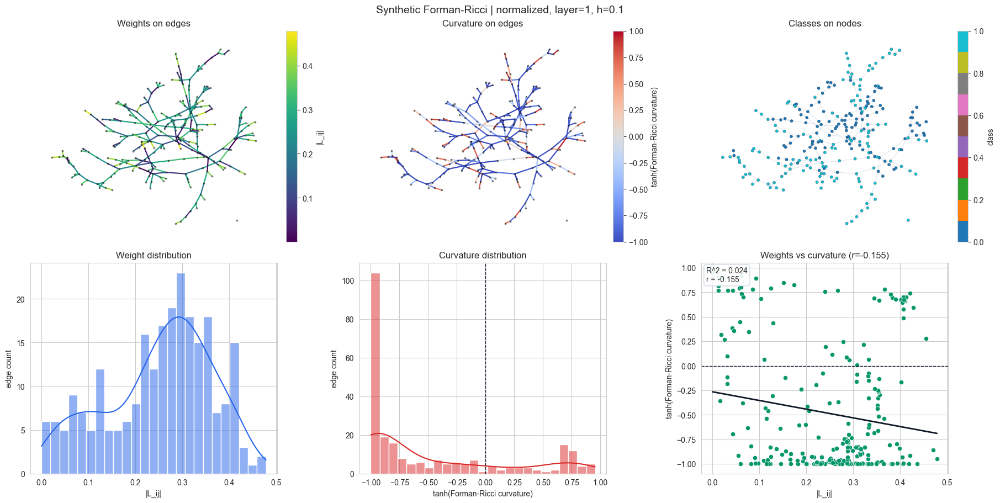

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,normalized,1,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.043922,-0.856259,-0.694325
1,normalized,1,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.127708,-0.319284,-0.308859
2,normalized,1,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.338629,-4.463380,-0.999734
3,normalized,1,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.226097,-0.928810,-0.730038
4,normalized,1,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.062141,0.940311,0.735365
5,normalized,1,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.216750,-3.749062,-0.998892
6,normalized,1,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.406809,0.661234,0.579184
7,normalized,1,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.226011,-3.777971,-0.998955
8,normalized,1,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.352937,-0.341527,-0.328840
9,normalized,1,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.296033,-0.939018,-0.734771


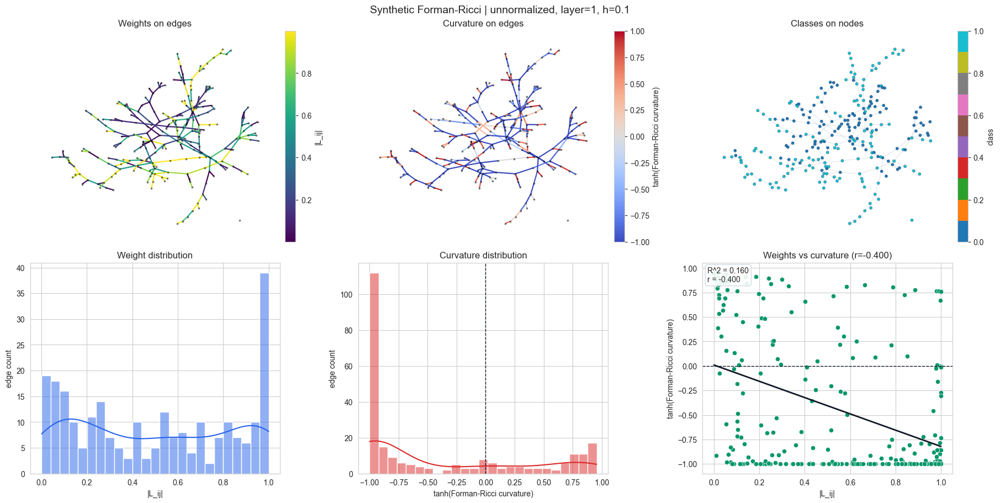

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,unnormalized,1,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.102794,-0.184889,-0.182810
1,unnormalized,1,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.801483,-1.939460,-0.959491
2,unnormalized,1,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.609055,-2.867286,-0.993556
3,unnormalized,1,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.258310,0.256456,0.250977
4,unnormalized,1,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.209056,0.531843,0.486789
5,unnormalized,1,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.646772,-10.332391,-1.000000
6,unnormalized,1,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.143470,1.228350,0.842100
7,unnormalized,1,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.975283,-6.507945,-0.999996
8,unnormalized,1,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.781408,0.218935,0.215503
9,unnormalized,1,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.995517,-1.262145,-0.851654


,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,normalized,0,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.271728,-13.943370,-1.000000
1,normalized,0,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.003275,1.762315,0.942761
2,normalized,0,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.200194,-8.777662,-1.000000
3,normalized,0,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.053054,0.956319,0.742630
4,normalized,0,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.172660,-0.686791,-0.595917
5,normalized,0,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.221549,-18.230409,-1.000000
6,normalized,0,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.000340,1.754570,0.941893
7,normalized,0,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.217896,-4.746728,-0.999849
8,normalized,0,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.334016,-1.016465,-0.768423
9,normalized,0,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.105616,-0.200391,-0.197751


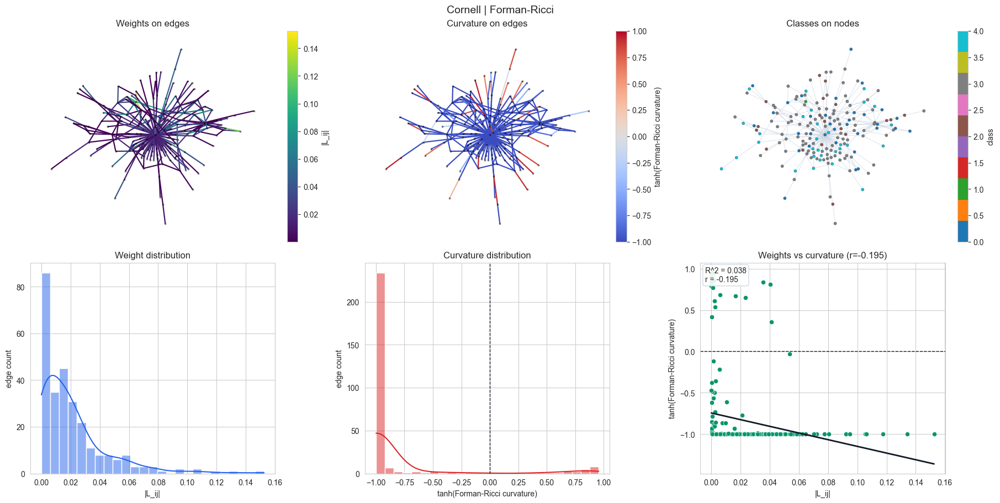

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,cornell,0,42,3,0,0-3,False,0.147442,0.105409,0.042033,0.156964,0.264210,0.018607,-107.151268,-1.000000
1,cornell,1,82,0,2,0-2,False,0.065795,0.082199,0.016404,0.085342,0.351541,0.034153,-55.452684,-1.000000
2,cornell,1,90,0,3,0-3,False,0.065795,0.103695,0.037900,0.105255,0.293374,0.031796,-2.444816,-0.985064
3,cornell,1,99,0,4,0-4,False,0.065795,0.110432,0.044636,0.114653,0.232508,0.017504,-10.460502,-1.000000
4,cornell,1,148,0,3,0-3,False,0.065795,0.130189,0.064394,0.134349,0.188448,0.006994,-28.218376,-1.000000
5,cornell,2,42,2,0,0-2,False,0.196116,0.105409,0.090707,0.184900,0.372104,0.008566,-71.738034,-1.000000
6,cornell,3,42,3,0,0-3,False,0.113961,0.105409,0.008551,0.144650,0.132137,0.013804,-94.954172,-1.000000
7,cornell,3,163,3,3,3-3,True,0.113961,0.100000,0.013961,0.127412,0.296298,0.001457,1.675066,0.932218
8,cornell,4,8,4,3,3-4,False,0.106600,0.103695,0.002905,0.125549,0.287403,0.002149,-6.190252,-0.999992
9,cornell,4,25,4,1,1-4,False,0.106600,0.149071,0.042471,0.137620,0.460840,0.134069,-71.061044,-1.000000


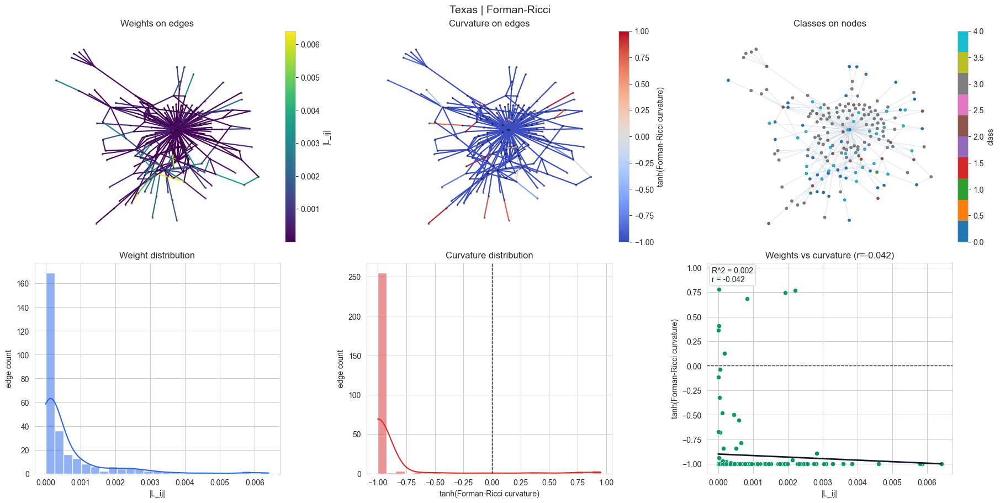

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,texas,0,58,3,2,2-3,False,0.147442,0.077382,0.070060,0.143867,0.308054,0.000239,-5.839917,-0.999983
1,texas,0,121,3,0,0-3,False,0.147442,0.101535,0.045907,0.148954,0.329350,0.002826,-1.439161,-0.893529
2,texas,1,80,0,4,0-4,False,0.065795,0.131306,0.065511,0.127850,0.302376,0.001201,-18.810127,-1.000000
3,texas,2,8,2,3,2-3,False,0.196116,0.103695,0.092421,0.198214,0.244036,0.000010,1.757608,0.942235
4,texas,3,56,3,0,0-3,False,0.113961,0.136083,0.022122,0.155854,0.232621,0.000093,-266.580949,-1.000000
5,texas,4,66,4,0,0-4,False,0.106600,0.048057,0.058543,0.104612,0.266390,0.001343,-16.447202,-1.000000
6,texas,4,146,4,3,3-4,False,0.106600,0.099015,0.007586,0.123993,0.274430,0.000134,-8.015458,-1.000000
7,texas,4,164,4,0,0-4,False,0.106600,0.122169,0.015569,0.128265,0.377676,0.001319,-3.577997,-0.998441
8,texas,5,20,3,0,0-3,False,0.100000,0.059761,0.040239,0.100712,0.286855,0.000775,-17.228582,-1.000000
9,texas,5,56,3,0,0-3,False,0.100000,0.136083,0.036083,0.138778,0.340207,0.000004,-52.772735,-1.000000


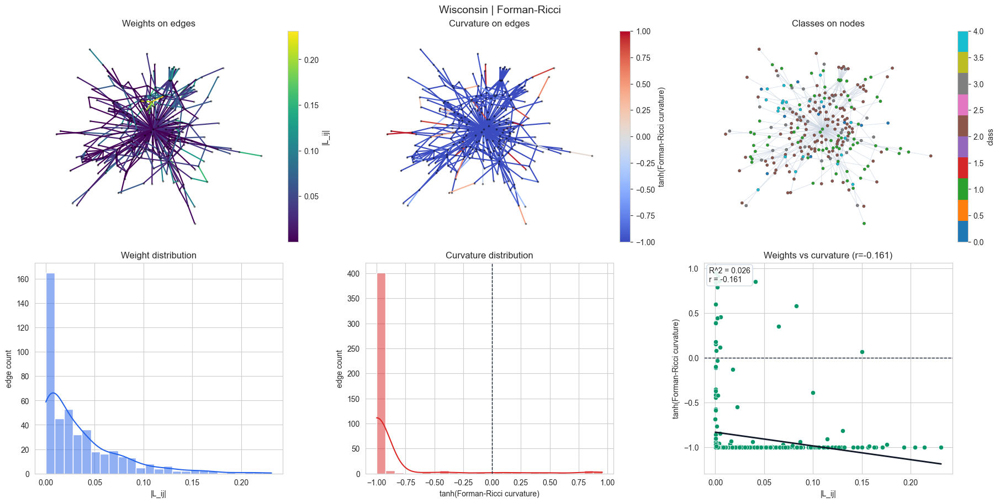

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,wisconsin,0,7,1,1,1-1,True,0.117851,0.144338,0.026486,0.150231,0.357217,0.023196,-2.978295,-0.994836
1,wisconsin,0,20,1,1,1-1,True,0.117851,0.144338,0.026486,0.150231,0.357217,0.045756,-12.074192,-1.000000
2,wisconsin,0,28,1,1,1-1,True,0.117851,0.083918,0.033933,0.117018,0.365924,0.013003,-8.904607,-1.000000
3,wisconsin,0,99,1,2,1-2,False,0.117851,0.156174,0.038323,0.152886,0.404916,0.140833,-10.794821,-1.000000
4,wisconsin,0,104,1,2,1-2,False,0.117851,0.078567,0.039284,0.119297,0.314815,0.040277,-20.611511,-1.000000
5,wisconsin,0,200,1,1,1-1,True,0.117851,0.123091,0.005240,0.128118,0.435194,0.046239,-4.693837,-0.999833
6,wisconsin,1,98,2,1,1-2,False,0.142857,0.107211,0.035646,0.131752,0.474793,0.030542,-456.339379,-1.000000
7,wisconsin,2,54,2,3,2-3,False,0.140028,0.064685,0.075343,0.129369,0.389479,0.015864,-14.176221,-1.000000
8,wisconsin,2,98,2,1,1-2,False,0.140028,0.107211,0.032817,0.132588,0.450377,0.027379,-433.216253,-1.000000
9,wisconsin,3,52,2,1,1-2,False,0.174078,0.086711,0.087367,0.166724,0.332078,0.085366,-19.315233,-1.000000


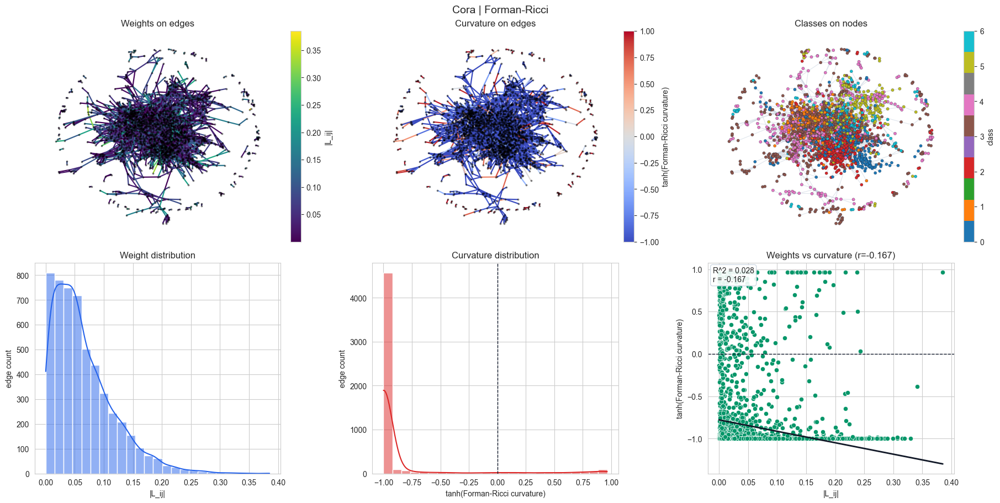

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,cora,0,633,3,3,3-3,True,0.333333,0.229416,0.103918,0.374634,0.152944,0.074674,-4.511156,-0.999759
1,cora,0,1862,3,3,3-3,True,0.333333,0.258199,0.075134,0.384900,0.172133,0.080578,-5.635665,-0.999975
2,cora,0,2582,3,3,3-3,True,0.333333,0.229416,0.103918,0.389932,0.076472,0.138921,-3.629830,-0.998594
3,cora,1,2,4,4,4-4,True,0.208514,0.229416,0.020901,0.287019,0.143509,0.014878,-4.135399,-0.999488
4,cora,1,652,4,4,4-4,True,0.208514,0.208514,0.000000,0.253520,0.260870,0.133778,-38.615418,-1.000000
5,cora,1,654,4,4,4-4,True,0.208514,0.208514,0.000000,0.245950,0.304348,0.219397,-3.120753,-0.996114
6,cora,2,332,4,3,3-4,False,0.229416,0.208514,0.020901,0.278932,0.191346,0.004074,-5.851687,-0.999983
7,cora,2,1454,4,4,4-4,True,0.229416,0.218218,0.011198,0.291913,0.150188,0.004350,-0.537088,-0.490781
8,cora,2,1666,4,3,3-4,False,0.229416,0.250000,0.020584,0.275060,0.344124,0.057641,-13.776998,-1.000000
9,cora,2,1986,4,3,3-4,False,0.229416,0.500000,0.270584,0.550120,0.000000,0.009180,-43.558823,-1.000000


,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,cornell,0,42,3,0,0-3,False,0.147442,0.105409,0.042033,0.156964,0.264210,0.018607,-107.151268,-1.000000
1,cornell,1,82,0,2,0-2,False,0.065795,0.082199,0.016404,0.085342,0.351541,0.034153,-55.452684,-1.000000
2,cornell,1,90,0,3,0-3,False,0.065795,0.103695,0.037900,0.105255,0.293374,0.031796,-2.444816,-0.985064
3,cornell,1,99,0,4,0-4,False,0.065795,0.110432,0.044636,0.114653,0.232508,0.017504,-10.460502,-1.000000
4,cornell,1,148,0,3,0-3,False,0.065795,0.130189,0.064394,0.134349,0.188448,0.006994,-28.218376,-1.000000
5,cornell,2,42,2,0,0-2,False,0.196116,0.105409,0.090707,0.184900,0.372104,0.008566,-71.738034,-1.000000
6,cornell,3,42,3,0,0-3,False,0.113961,0.105409,0.008551,0.144650,0.132137,0.013804,-94.954172,-1.000000
7,cornell,3,163,3,3,3-3,True,0.113961,0.100000,0.013961,0.127412,0.296298,0.001457,1.675066,0.932218
8,cornell,4,8,4,3,3-4,False,0.106600,0.103695,0.002905,0.125549,0.287403,0.002149,-6.190252,-0.999992
9,cornell,4,25,4,1,1-4,False,0.106600,0.149071,0.042471,0.137620,0.460840,0.134069,-71.061044,-1.000000


In [266]:
# FORMAN_METHOD = "augmented"
FORMAN_METHOD = "1d"

def compute_graph_forman_ricci(graph, method=FORMAN_METHOD, weight=GRAPH_RICCI_WEIGHT):
    """Compute Forman-Ricci curvature on a weighted NetworkX graph."""
    from GraphRicciCurvature.FormanRicci import FormanRicci

    if "prepare_graph_for_graph_ricci" in globals():
        graph_for_curvature = prepare_graph_for_graph_ricci(graph, weight=weight)
    else:
        graph_for_curvature = graph.copy()
        for _, _, data in graph_for_curvature.edges(data=True):
            data[weight] = max(abs(float(data.get(weight, 1.0))), 1e-12)

    forman = FormanRicci(graph_for_curvature, weight=weight, method=method, verbose=GRAPH_RICCI_VERBOSE)
    forman.compute_ricci_curvature()

    edge_curvature = edge_curvature_dict(forman.G, curvature_attribute="formanCurvature")
    summary = summarize_edge_curvature(list(edge_curvature.values()))
    summary.update({
        "nodes": forman.G.number_of_nodes(),
        "edges": forman.G.number_of_edges(),
        "components": nx.number_connected_components(forman.G),
        "method": f"Forman-{method}",
    })

    return {"graph": forman.G, "edge_curvature": edge_curvature, "summary": summary}


forman_synthetic_results = {}
forman_synthetic_edge_tables = {}

for key, or_result in synthetic_or_results.items():
    combination, laplacian_label = key
    layer, het_coef, num_classes, num_feats = combination
    forman_result = compute_graph_forman_ricci(or_result["graph"])
    forman_synthetic_results[key] = forman_result

    edge_df = build_feature_edge_frame(synthetic_data, forman_result)
    edge_df.insert(0, "laplacian", laplacian_label)
    edge_df.insert(1, "layer", layer)
    edge_df.insert(2, "heterophily", het_coef)
    forman_synthetic_edge_tables[key] = edge_df

    title = f"Synthetic Forman-Ricci | {laplacian_label}, layer={layer}, h={het_coef}"
    plot_basic_synthetic_dataset_views(
        synthetic_data,
        node_df,
        forman_result,
        title,
        curvature_name="Forman-Ricci curvature",
        tanh_scale=GRAPH_RICCI_TANH_SCALE,
    )
    display(edge_df.head(20))

forman_synthetic_edge_analysis = pd.concat(forman_synthetic_edge_tables.values(), ignore_index=True)
display(forman_synthetic_edge_analysis.head(50))

if globals().get("classical_or_results"):
    forman_classical_results = {}
    forman_classical_edge_tables = {}

    for dataset_name, or_result in classical_or_results.items():
        forman_result = compute_graph_forman_ricci(or_result["graph"])
        forman_classical_results[dataset_name] = forman_result

        edge_df = build_feature_edge_frame(classical_data_objects[dataset_name], forman_result)
        edge_df.insert(0, "dataset", dataset_name)
        forman_classical_edge_tables[dataset_name] = edge_df

        plot_basic_synthetic_dataset_views(
            classical_data_objects[dataset_name],
            classical_node_tables[dataset_name],
            forman_result,
            f"{dataset_name.title().capitalize()} | Forman-Ricci",
            curvature_name="Forman-Ricci curvature",
            tanh_scale=GRAPH_RICCI_TANH_SCALE,
        )
        display(edge_df.head(20))

    forman_classical_edge_analysis = pd.concat(forman_classical_edge_tables.values(), ignore_index=True)
    display(forman_classical_edge_analysis.head(50))


## 10. Effective Resistence Curvature

In [267]:
RESISTANCE_CONDUCTANCE_KEY = "conductance"
RESISTANCE_CURVATURE_KEY = "resistanceCurvature"


def graph_with_conductances(graph, weight=GRAPH_RICCI_WEIGHT, conductance_key=RESISTANCE_CONDUCTANCE_KEY):
    """Copy a graph and store positive edge conductances for resistance curvature."""
    H = nx.Graph()
    H.add_nodes_from(graph.nodes(data=True))
    for u, v, data in graph.edges(data=True):
        conductance = max(abs(float(data.get(weight, data.get(conductance_key, 1.0)))), 1e-12)
        edge_data = dict(data)
        edge_data.update({conductance_key: conductance, weight: conductance})
        H.add_edge(u, v, **edge_data)
    return H


def effective_resistance_curvature(graph, conductance_key=RESISTANCE_CONDUCTANCE_KEY):
    """Compute node and link resistance curvature from Devriendt-Lambiotte.

    For each node i: p_i = 1 - 1/2 sum_{j~i} c_ij omega_ij.
    For each edge ij: kappa_ij = 2(p_i + p_j) / omega_ij.
    Here c_ij is the edge conductance and omega_ij is effective resistance.
    """
    H = graph_with_conductances(graph, conductance_key=conductance_key)
    node_curvature = {node: 1.0 for node in H.nodes()}
    edge_curvature = {}
    edge_resistance = {}

    for component_nodes in nx.connected_components(H):
        nodes = list(component_nodes)
        if len(nodes) == 1:
            node_curvature[nodes[0]] = 1.0
            continue

        index = {node: i for i, node in enumerate(nodes)}
        laplacian = np.zeros((len(nodes), len(nodes)), dtype=float)
        for u, v, data in H.subgraph(nodes).edges(data=True):
            conductance = data[conductance_key]
            i, j = index[u], index[v]
            laplacian[i, i] += conductance
            laplacian[j, j] += conductance
            laplacian[i, j] -= conductance
            laplacian[j, i] -= conductance

        laplacian_pinv = np.linalg.pinv(laplacian, hermitian=True)
        component_node_curvature = {node: 1.0 for node in nodes}

        for u, v, data in H.subgraph(nodes).edges(data=True):
            i, j = index[u], index[v]
            resistance = max(laplacian_pinv[i, i] + laplacian_pinv[j, j] - 2 * laplacian_pinv[i, j], 1e-12)
            relative_resistance = data[conductance_key] * resistance
            component_node_curvature[u] -= 0.5 * relative_resistance
            component_node_curvature[v] -= 0.5 * relative_resistance
            edge_resistance[tuple(sorted((u, v)))] = float(resistance)

        node_curvature.update(component_node_curvature)
        for u, v in H.subgraph(nodes).edges():
            edge = tuple(sorted((u, v)))
            curvature = 2 * (component_node_curvature[u] + component_node_curvature[v]) / edge_resistance[edge]
            edge_curvature[edge] = float(curvature)

    nx.set_node_attributes(H, node_curvature, RESISTANCE_CURVATURE_KEY)
    nx.set_edge_attributes(H, edge_curvature, RESISTANCE_CURVATURE_KEY)
    nx.set_edge_attributes(H, edge_resistance, "effectiveResistance")

    summary = summarize_edge_curvature(list(edge_curvature.values()))
    summary.update({
        "nodes": H.number_of_nodes(),
        "edges": H.number_of_edges(),
        "components": nx.number_connected_components(H),
        "method": "effective-resistance",
    })

    return {
        "graph": H,
        "node_curvature": node_curvature,
        "edge_curvature": edge_curvature,
        "edge_resistance": edge_resistance,
        "summary": summary,
    }


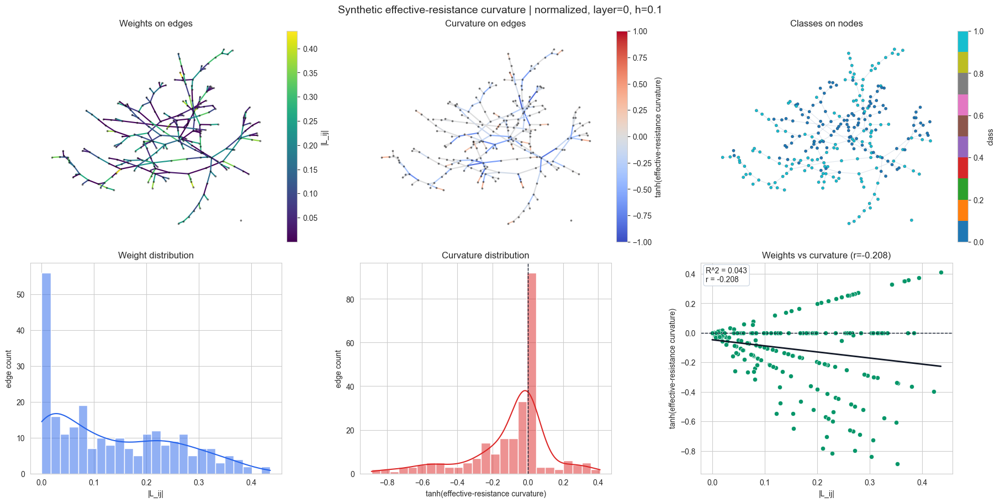

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,normalized,0,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.271728,-1.086911e+00,-7.957480e-01
1,normalized,0,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.003275,5.781139e-17,5.781139e-17
2,normalized,0,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.200194,-4.003870e-01,-3.802801e-01
3,normalized,0,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.053054,4.877092e-15,4.877092e-15
4,normalized,0,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.172660,1.867069e-14,1.867069e-14
5,normalized,0,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.221549,-6.646482e-01,-5.814484e-01
6,normalized,0,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.000340,3.399852e-04,3.399852e-04
7,normalized,0,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.217896,-8.715837e-01,-7.021779e-01
8,normalized,0,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.334016,-8.974152e-15,-8.974152e-15
9,normalized,0,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.105616,-1.056163e-01,-1.052253e-01


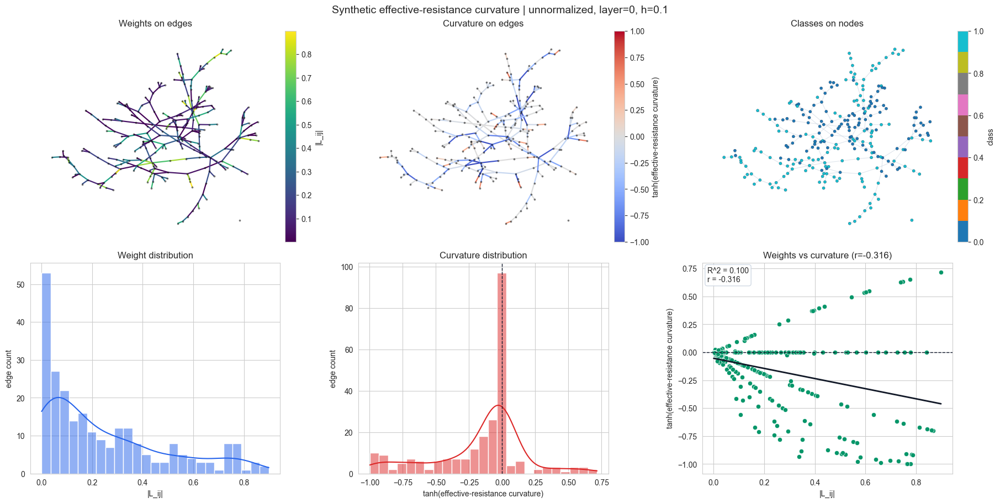

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,unnormalized,0,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.763077,-3.052308e+00,-9.955449e-01
1,unnormalized,0,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.008931,2.429244e-16,2.429244e-16
2,unnormalized,0,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.358380,-7.167600e-01,-6.148983e-01
3,unnormalized,0,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.159617,0.000000e+00,0.000000e+00
4,unnormalized,0,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.299662,-2.129228e-15,-2.129228e-15
5,unnormalized,0,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.506372,-1.519116e+00,-9.085434e-01
6,unnormalized,0,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.033380,3.338005e-02,3.336766e-02
7,unnormalized,0,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.569002,-2.276008e+00,-9.791283e-01
8,unnormalized,0,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.649060,6.269232e-15,6.269232e-15
9,unnormalized,0,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.301288,-3.012880e-01,-2.924909e-01


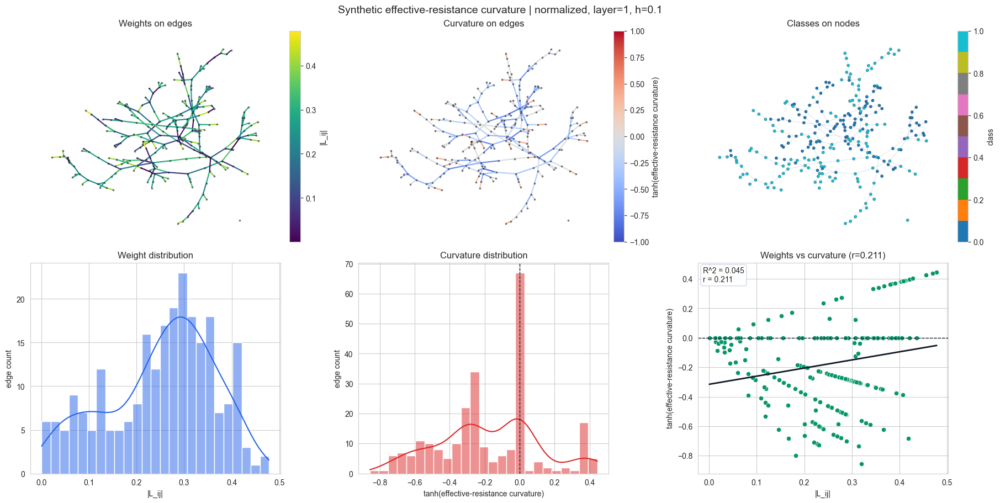

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,normalized,1,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.043922,-1.756884e-01,-1.739028e-01
1,normalized,1,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.127708,4.437863e-15,4.437863e-15
2,normalized,1,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.338629,-6.772582e-01,-5.897340e-01
3,normalized,1,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.226097,1.004071e-16,1.004071e-16
4,normalized,1,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.062141,1.655758e-16,1.655758e-16
5,normalized,1,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.216750,-6.502513e-01,-5.718391e-01
6,normalized,1,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.406809,4.068091e-01,3.857599e-01
7,normalized,1,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.226011,-9.040455e-01,-7.182620e-01
8,normalized,1,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.352937,1.449805e-15,1.449805e-15
9,normalized,1,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.296033,-2.960326e-01,-2.876777e-01


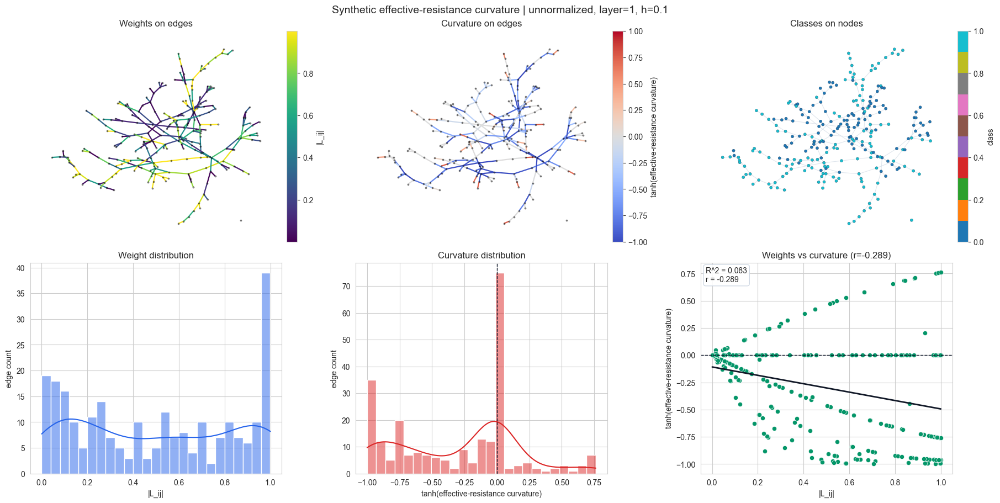

,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,unnormalized,1,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.102794,-4.111744e-01,-3.894694e-01
1,unnormalized,1,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.801483,-1.245755e-14,-1.245755e-14
2,unnormalized,1,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.609055,-1.218109e+00,-8.390956e-01
3,unnormalized,1,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.258310,2.093508e-15,2.093508e-15
4,unnormalized,1,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.209056,6.730871e-16,6.730871e-16
5,unnormalized,1,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.646772,-1.940316e+00,-9.595591e-01
6,unnormalized,1,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.143470,1.434695e-01,1.424932e-01
7,unnormalized,1,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.975283,-3.901132e+00,-9.991827e-01
8,unnormalized,1,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.781408,3.383394e-15,3.383394e-15
9,unnormalized,1,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.995517,-9.955172e-01,-7.597051e-01


,laplacian,layer,heterophily,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,normalized,0,0.1,0,69,1,1,1-1,True,0.938586,0.893540,0.045046,0.339835,0.932357,0.271728,-1.086911e+00,-7.957480e-01
1,normalized,0,0.1,0,134,1,1,1-1,True,0.938586,0.737876,0.200710,1.586167,-0.787311,0.003275,5.781139e-17,5.781139e-17
2,normalized,0,0.1,0,169,1,1,1-1,True,0.938586,0.640620,0.297966,0.582159,0.792005,0.200194,-4.003870e-01,-3.802801e-01
3,normalized,0,0.1,1,9,0,0,0-0,True,0.508402,0.477685,0.030717,0.840038,-0.450901,0.053054,4.877092e-15,4.877092e-15
4,normalized,0,0.1,1,98,0,0,0-0,True,0.508402,0.513896,0.005493,0.609503,0.289107,0.172660,1.867069e-14,1.867069e-14
5,normalized,0,0.1,1,136,0,0,0-0,True,0.508402,0.481064,0.027338,0.297742,0.820294,0.221549,-6.646482e-01,-5.814484e-01
6,normalized,0,0.1,2,122,0,0,0-0,True,0.663315,0.518485,0.144830,0.941395,-0.257927,0.000340,3.399852e-04,3.399852e-04
7,normalized,0,0.1,3,62,1,1,1-1,True,0.939239,0.629686,0.309553,0.772961,0.575901,0.217896,-8.715837e-01,-7.021779e-01
8,normalized,0,0.1,3,137,1,1,1-1,True,0.939239,0.871874,0.067365,0.438170,0.885544,0.334016,-8.974152e-15,-8.974152e-15
9,normalized,0,0.1,3,145,1,1,1-1,True,0.939239,0.930921,0.008319,1.813542,-0.880733,0.105616,-1.056163e-01,-1.052253e-01


,key,min,mean,median,max,std,nodes,edges,components,method
0,"((0, 0.1, 2, 32), 'normalized')",-1.411997,-0.118422,-0.012645,0.435930,0.276559,250,248,4,effective-resistance
1,"((0, 0.1, 2, 32), 'unnormalized')",-3.824650,-0.261079,-0.038602,0.898933,0.621804,250,248,4,effective-resistance
2,"((1, 0.1, 2, 32), 'normalized')",-1.278760,-0.199377,-0.228232,0.478377,0.333972,250,248,4,effective-resistance
3,"((1, 0.1, 2, 32), 'unnormalized')",-3.901132,-0.544741,-0.128320,0.999279,0.903518,250,248,4,effective-resistance


In [268]:
if not globals().get("synthetic_or_results"):
    raise RuntimeError("Run section 7.4 first, so synthetic_or_results contains weighted graphs.")

resistance_synthetic_results = {}
resistance_synthetic_edge_tables = {}

for key, or_result in synthetic_or_results.items():
    combination, laplacian_label = key
    layer, het_coef, num_classes, num_feats = combination
    resistance_result = effective_resistance_curvature(or_result["graph"])
    resistance_synthetic_results[key] = resistance_result

    edge_df = build_feature_edge_frame(synthetic_data, resistance_result, tanh_scale=GRAPH_RICCI_TANH_SCALE)
    edge_df.insert(0, "laplacian", laplacian_label)
    edge_df.insert(1, "layer", layer)
    edge_df.insert(2, "heterophily", het_coef)
    resistance_synthetic_edge_tables[key] = edge_df

    title = f"Synthetic effective-resistance curvature | {laplacian_label}, layer={layer}, h={het_coef}"
    plot_basic_synthetic_dataset_views(
        synthetic_data,
        node_df,
        resistance_result,
        title,
        curvature_name="effective-resistance curvature",
        tanh_scale=GRAPH_RICCI_TANH_SCALE,
    )
    display(edge_df.head(20))

resistance_synthetic_edge_analysis = pd.concat(resistance_synthetic_edge_tables.values(), ignore_index=True)
display(resistance_synthetic_edge_analysis.head(50))
display(pd.DataFrame([{"key": str(key), **result["summary"]} for key, result in resistance_synthetic_results.items()]))


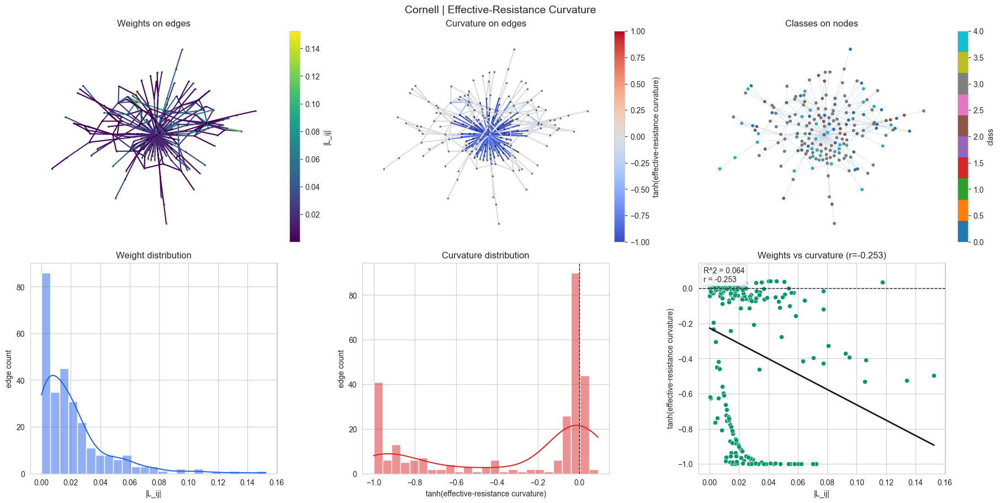

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,cornell,0,42,3,0,0-3,False,0.147442,0.105409,0.042033,0.156964,0.264210,0.018607,-1.373412,-0.879467
1,cornell,1,82,0,2,0-2,False,0.065795,0.082199,0.016404,0.085342,0.351541,0.034153,-0.021391,-0.021388
2,cornell,1,90,0,3,0-3,False,0.065795,0.103695,0.037900,0.105255,0.293374,0.031796,-0.014005,-0.014004
3,cornell,1,99,0,4,0-4,False,0.065795,0.110432,0.044636,0.114653,0.232508,0.017504,-0.016102,-0.016101
4,cornell,1,148,0,3,0-3,False,0.065795,0.130189,0.064394,0.134349,0.188448,0.006994,-0.033804,-0.033791
5,cornell,2,42,2,0,0-2,False,0.196116,0.105409,0.090707,0.184900,0.372104,0.008566,-0.632274,-0.559616
6,cornell,3,42,3,0,0-3,False,0.113961,0.105409,0.008551,0.144650,0.132137,0.013804,-1.032725,-0.774999
7,cornell,3,163,3,3,3-3,True,0.113961,0.100000,0.013961,0.127412,0.296298,0.001457,0.001457,0.001457
8,cornell,4,8,4,3,3-4,False,0.106600,0.103695,0.002905,0.125549,0.287403,0.002149,0.006712,0.006712
9,cornell,4,25,4,1,1-4,False,0.106600,0.149071,0.042471,0.137620,0.460840,0.134069,-0.580592,-0.523095


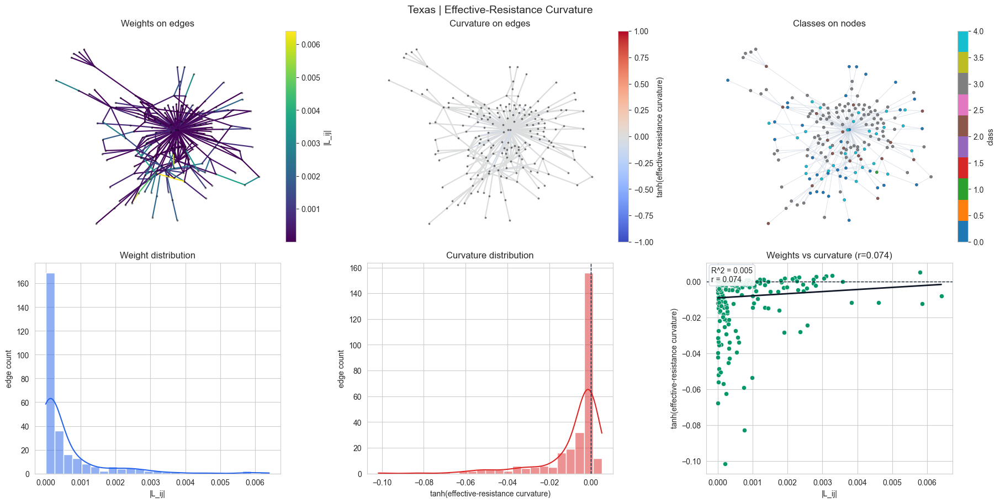

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,texas,0,58,3,2,2-3,False,0.147442,0.077382,0.070060,0.143867,0.308054,0.000239,-0.001039,-0.001039
1,texas,0,121,3,0,0-3,False,0.147442,0.101535,0.045907,0.148954,0.329350,0.002826,0.002826,0.002826
2,texas,1,80,0,4,0-4,False,0.065795,0.131306,0.065511,0.127850,0.302376,0.001201,-0.000842,-0.000842
3,texas,2,8,2,3,2-3,False,0.196116,0.103695,0.092421,0.198214,0.244036,0.000010,0.000010,0.000010
4,texas,3,56,3,0,0-3,False,0.113961,0.136083,0.022122,0.155854,0.232621,0.000093,-0.005068,-0.005068
5,texas,4,66,4,0,0-4,False,0.106600,0.048057,0.058543,0.104612,0.266390,0.001343,-0.014506,-0.014505
6,texas,4,146,4,3,3-4,False,0.106600,0.099015,0.007586,0.123993,0.274430,0.000134,-0.000714,-0.000714
7,texas,4,164,4,0,0-4,False,0.106600,0.122169,0.015569,0.128265,0.377676,0.001319,0.001336,0.001336
8,texas,5,20,3,0,0-3,False,0.100000,0.059761,0.040239,0.100712,0.286855,0.000775,-0.000942,-0.000942
9,texas,5,56,3,0,0-3,False,0.100000,0.136083,0.036083,0.138778,0.340207,0.000004,-0.012136,-0.012136


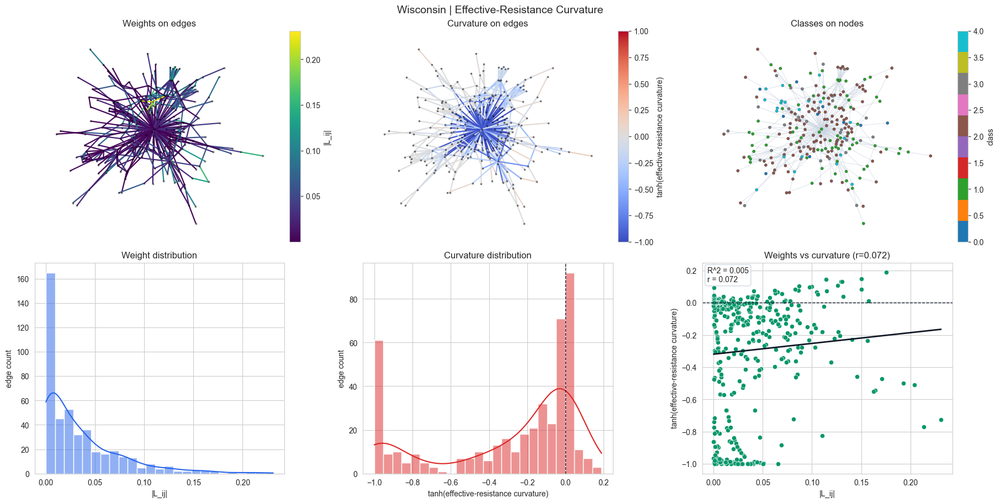

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,wisconsin,0,7,1,1,1-1,True,0.117851,0.144338,0.026486,0.150231,0.357217,0.023196,-0.043774,-0.043746
1,wisconsin,0,20,1,1,1-1,True,0.117851,0.144338,0.026486,0.150231,0.357217,0.045756,-0.484289,-0.449672
2,wisconsin,0,28,1,1,1-1,True,0.117851,0.083918,0.033933,0.117018,0.365924,0.013003,-0.041018,-0.040995
3,wisconsin,0,99,1,2,1-2,False,0.117851,0.156174,0.038323,0.152886,0.404916,0.140833,-0.232064,-0.227986
4,wisconsin,0,104,1,2,1-2,False,0.117851,0.078567,0.039284,0.119297,0.314815,0.040277,-0.240396,-0.235870
5,wisconsin,0,200,1,1,1-1,True,0.117851,0.123091,0.005240,0.128118,0.435194,0.046239,-0.091631,-0.091375
6,wisconsin,1,98,2,1,1-2,False,0.142857,0.107211,0.035646,0.131752,0.474793,0.030542,-1.819869,-0.948825
7,wisconsin,2,54,2,3,2-3,False,0.140028,0.064685,0.075343,0.129369,0.389479,0.015864,-0.037222,-0.037205
8,wisconsin,2,98,2,1,1-2,False,0.140028,0.107211,0.032817,0.132588,0.450377,0.027379,-2.175640,-0.974547
9,wisconsin,3,52,2,1,1-2,False,0.174078,0.086711,0.087367,0.166724,0.332078,0.085366,-0.478498,-0.445040


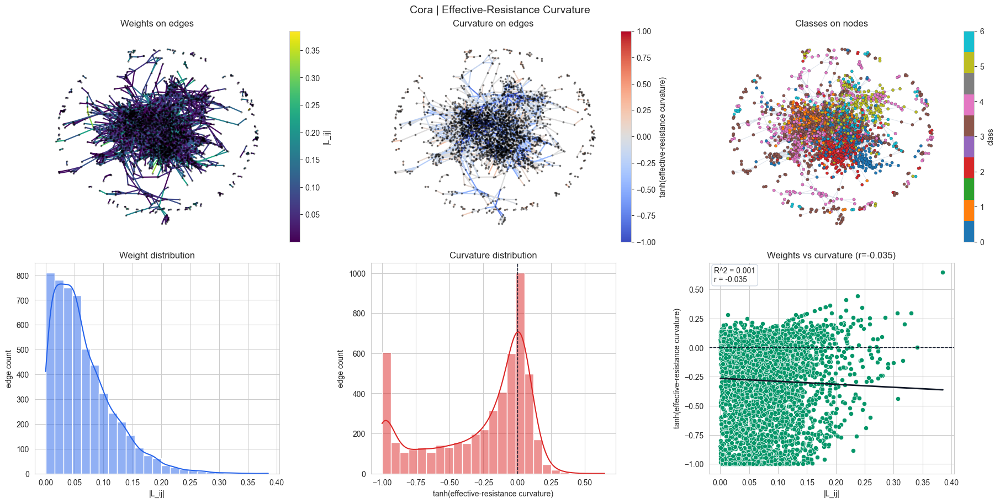

,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,cora,0,633,3,3,3-3,True,0.333333,0.229416,0.103918,0.374634,0.152944,0.074674,0.041173,0.041149
1,cora,0,1862,3,3,3-3,True,0.333333,0.258199,0.075134,0.384900,0.172133,0.080578,-0.097197,-0.096892
2,cora,0,2582,3,3,3-3,True,0.333333,0.229416,0.103918,0.389932,0.076472,0.138921,-0.018299,-0.018297
3,cora,1,2,4,4,4-4,True,0.208514,0.229416,0.020901,0.287019,0.143509,0.014878,-0.031371,-0.031360
4,cora,1,652,4,4,4-4,True,0.208514,0.208514,0.000000,0.253520,0.260870,0.133778,-0.000204,-0.000204
5,cora,1,654,4,4,4-4,True,0.208514,0.208514,0.000000,0.245950,0.304348,0.219397,0.001600,0.001600
6,cora,2,332,4,3,3-4,False,0.229416,0.208514,0.020901,0.278932,0.191346,0.004074,-0.047447,-0.047411
7,cora,2,1454,4,4,4-4,True,0.229416,0.218218,0.011198,0.291913,0.150188,0.004350,-0.000444,-0.000444
8,cora,2,1666,4,3,3-4,False,0.229416,0.250000,0.020584,0.275060,0.344124,0.057641,-0.202387,-0.199669
9,cora,2,1986,4,3,3-4,False,0.229416,0.500000,0.270584,0.550120,0.000000,0.009180,-1.373888,-0.879575


,dataset,source,target,source_class,target_class,class_pair,same_class,source_feature_norm,target_feature_norm,feature_norm_diff,feature_distance,feature_cosine,weight,curvature,shown_curvature
0,cornell,0,42,3,0,0-3,False,0.147442,0.105409,0.042033,0.156964,0.264210,0.018607,-1.373412,-0.879467
1,cornell,1,82,0,2,0-2,False,0.065795,0.082199,0.016404,0.085342,0.351541,0.034153,-0.021391,-0.021388
2,cornell,1,90,0,3,0-3,False,0.065795,0.103695,0.037900,0.105255,0.293374,0.031796,-0.014005,-0.014004
3,cornell,1,99,0,4,0-4,False,0.065795,0.110432,0.044636,0.114653,0.232508,0.017504,-0.016102,-0.016101
4,cornell,1,148,0,3,0-3,False,0.065795,0.130189,0.064394,0.134349,0.188448,0.006994,-0.033804,-0.033791
5,cornell,2,42,2,0,0-2,False,0.196116,0.105409,0.090707,0.184900,0.372104,0.008566,-0.632274,-0.559616
6,cornell,3,42,3,0,0-3,False,0.113961,0.105409,0.008551,0.144650,0.132137,0.013804,-1.032725,-0.774999
7,cornell,3,163,3,3,3-3,True,0.113961,0.100000,0.013961,0.127412,0.296298,0.001457,0.001457,0.001457
8,cornell,4,8,4,3,3-4,False,0.106600,0.103695,0.002905,0.125549,0.287403,0.002149,0.006712,0.006712
9,cornell,4,25,4,1,1-4,False,0.106600,0.149071,0.042471,0.137620,0.460840,0.134069,-0.580592,-0.523095


,dataset,min,mean,median,max,std,nodes,edges,components,method
0,cornell,-8.826684,-0.784526,-0.043072,0.091494,1.463958,183,277,1,effective-resistance
1,texas,-0.102088,-0.008427,-0.001573,0.005205,0.015361,183,279,1,effective-resistance
2,wisconsin,-9.795810,-0.735727,-0.125793,0.191125,1.520331,251,450,1,effective-resistance
3,cora,-47.700341,-0.794210,-0.125737,0.770213,2.318284,2708,5278,78,effective-resistance


In [269]:
if globals().get("classical_or_results"):
    resistance_classical_results = {}
    resistance_classical_edge_tables = {}

    for dataset_name, or_result in classical_or_results.items():
        resistance_result = effective_resistance_curvature(or_result["graph"])
        resistance_classical_results[dataset_name] = resistance_result

        edge_df = build_feature_edge_frame(classical_data_objects[dataset_name], resistance_result, tanh_scale=GRAPH_RICCI_TANH_SCALE)
        edge_df.insert(0, "dataset", dataset_name)
        resistance_classical_edge_tables[dataset_name] = edge_df

        title = f"{dataset_name.title().capitalize()} | Effective-Resistance Curvature"
        plot_basic_synthetic_dataset_views(
            classical_data_objects[dataset_name],
            classical_node_tables[dataset_name],
            resistance_result,
            title,
            curvature_name="effective-resistance curvature",
            tanh_scale=GRAPH_RICCI_TANH_SCALE,
        )
        display(edge_df.head(20))

    resistance_classical_edge_analysis = pd.concat(resistance_classical_edge_tables.values(), ignore_index=True)
    display(resistance_classical_edge_analysis.head(50))
    display(pd.DataFrame([{"dataset": name, **result["summary"]} for name, result in resistance_classical_results.items()]))
else:
    print("Run section 8.2 first to enable effective-resistance analysis on classical datasets.")


## 11. Analysis of oversquashing-prone graphs *à la Bronstein*